## DEFINICIÓN DEL PROYECTO <BR>
Vamos a desarrollar un modelo que prediga si un usuario va a convertir o no, en función de unas variables de campaña y de usuario. <br>
Para este proyecto, desarrollaremos 3 enfoques: <br>
1- Enfoque de modelo estadístico: al tratarse de una regresión logística, emplearemos los paquetes estadísticos xxx para crear el modelo de regresión, probarlo y validarlo. <br>
2- Enfoque de machine learning: emplearemos librerías de machine learning que nos indiquen cuál es el mejor modelo a aplicar para este problema. <br>
3- Enfoque de deep learning: emplearemos una red neuronal para obtener el modelo. <br>
4- Compararemos finalmente los 3 resultados. <br>

La fase de análisis de los datos inicla será común para los tres enfoques, y posteriormente se crearán datasets específicos que cumplan los requisitos de cada enfoque. <br>

## 0- IMPORTACIÓN DE LIBRERÍAS Y FUNCIONES<br>


In [1]:
## LIBRERÍAS BÁSICAS
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

#from datetime import datetime
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime
import plotly.express as px
import scipy.stats as stats
from collections import Counter
import pickle

# LIBRERÍAS PARA HACER TRAMIFICACIONES, AGRUPACIONES Y TRANSFORMACIONES
from optbinning import Scorecard, BinningProcess, OptimalBinning, MulticlassOptimalBinning
from optbinning.scorecard import plot_auc_roc, plot_cap, plot_ks
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import scale
from sklearn.preprocessing import label_binarize


# LIBRERÍAS PARA MODELADOS
import pycaret
from pycaret.classification import *
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from relativeImp import relativeImp
from statsmodels.formula.api import logit 
import statsmodels.api as sm
import patsy
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import BaggingClassifier
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report
from imblearn.over_sampling import SMOTE
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from imblearn.combine import SMOTETomek


# LIBRERÍAS PARA VISUALIZACIONES
from explainerdashboard import ClassifierExplainer, RegressionExplainer
import gradio as gr
import plotly.graph_objects as go
import matplotlib.pyplot as pyplot
import seaborn as sns
import ydata_profiling
import lime
from lime import lime_tabular

pd.set_option("display.max_rows", None, "display.max_columns", None)


# FUNCIÓN V DE CRAMER : empleamos imput como dataset de variables y varObj como variable objetivo
# Las tablas de contingencia miden la asociación entre dos variables categóricas, así que como tenemos variables numéricas, las tramificamos en 5 grupos.
def cramers_v(var1, varObj):
    
    if not var1.dtypes == 'category':
        #bins = min(5,var1.value_counts().count())
        var1 = pd.cut(var1, bins = 5)
    if not varObj.dtypes == 'category': #np.issubdtype(varObj, np.number):
        #bins = min(5,varObj.value_counts().count())
        varObj = pd.cut(varObj, bins = 5)
        
    data = pd.crosstab(var1, varObj).values
    vCramer = stats.contingency.association(data, method = 'cramer')
    return vCramer



## FUNCIÓN MEJOR TRANSFORMACIÓN ##
# Busca la transformación de variables input de intervalo que maximiza la VCramer o 
# la correlación tipo Pearson con la objetivo
def mejorTransf (vv,target, name=False, tipo = 'cramer', graf=False):
    
    # Escalado de datos (evitar fallos de tamaño de float64 al hacer exp de número grande..cosas de python)
    vv = pd.Series(scale(vv), name=vv.name)
    # Traslación a valores positivos de la variable (sino falla log y las raíces!)
    vv = vv + abs(min(vv))+0.0001
      
    # Definimos y calculamos las transformaciones típicas  
    transf = pd.DataFrame({vv.name + '_ident': vv, vv.name + '_log': np.log(vv), vv.name + '_exp': np.exp(vv), vv.name + '_sqrt': np.sqrt(vv), 
                         vv.name + '_sqr': np.square(vv), vv.name + '_cuarta': vv**4, vv.name + '_raiz4': vv**(1/4)})
      
    # Distinguimos caso cramer o caso correlación
    if tipo == 'cramer':
      # Aplicar la función cramers_v a cada transformación frente a la respuesta
      tablaCramer = pd.DataFrame(transf.apply(lambda x: cramers_v(x,target)),columns=['VCramer'])
      
      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # Identificar mejor transformación
      best = tablaCramer.query('VCramer == VCramer.max()').index
      ser = transf[best[0]].squeeze()
    
    if tipo == 'cor':
      # Aplicar coeficiente de correlación a cada transformación frente a la respuesta
      tablaCorr = pd.DataFrame(transf.apply(lambda x: np.corrcoef(x,target)[0,1]),columns=['Corr'])
      # Si queremos gráfico, muestra comparativa entre las posibilidades
      if graf: px.bar(tablaCorr,x=tablaCorr.Corr,title='Relaciones frente a ' + target.name).update_yaxes(categoryorder="total ascending").show()
      # identificar mejor transformación
      best = tablaCorr.query('Corr.abs() == Corr.abs().max()').index
      ser = transf[best[0]].squeeze()
  
    # Aquí distingue si se devuelve la variable transformada o solamente el nombre de la transformación
    if name:
      return(ser.name)
    else:
      return(ser)


# Función para generar la fórmula de la regresión logística
def ols_formula(df, dependent_var, *excluded_cols):
    df_columns = list(df.columns.values)
    df_columns.remove(dependent_var)
    for col in excluded_cols:
        df_columns.remove(col)
    return dependent_var + ' ~ ' + ' + '.join(df_columns)


# Función para dibujar la curva ROC
#Generamos un clasificador sin entrenar , que asignará 0 a todo
def curva_roc(ytest,ypred,model,xtest):
    ns_probs = [0 for _ in range(len(ytest))]
    # Predecimos las probabilidades
    lr_probs = model.predict_proba(xtest)

    #Nos quedamos con las probabilidades de la clase positiva (la probabilidad de 1)
    lr_probs = lr_probs[:, 1]

    # Calculamos el AUC
    ns_auc = roc_auc_score(ytest, ns_probs)
    lr_auc = roc_auc_score(ytest, lr_probs)
    # Imprimimos en pantalla
    print('Sin entrenar: ROC AUC=%.3f' % (ns_auc))
    print('Regresión Logística: ROC AUC=%.3f' % (lr_auc))
    # Calculamos las curvas ROC
    ns_fpr, ns_tpr, _ = roc_curve(ytest, ns_probs)
    lr_fpr, lr_tpr, _ = roc_curve(ytest, lr_probs)
    # Pintamos las curvas ROC
    pyplot.plot(ns_fpr, ns_tpr, linestyle='--', label='Sin entrenar')
    pyplot.plot(lr_fpr, lr_tpr, marker='.', label='Regresión Logística')
    # Etiquetas de los ejes
    pyplot.xlabel('Tasa de Falsos Positivos')
    pyplot.ylabel('Tasa de Verdaderos Positivos')
    pyplot.legend()
    pyplot.show()


#definimos funcion para mostrar los resultados
def mostrar_matriz(y_test, pred_y):
    LABELS= ['No convierte','Convierte']
    conf_matrix = confusion_matrix(y_test, pred_y)
    pyplot.figure(figsize=(4, 4))
    sns.heatmap(conf_matrix, xticklabels=LABELS, yticklabels=LABELS, annot=True, fmt="d");
    pyplot.title("Confusion matrix")
    pyplot.ylabel('True class')
    pyplot.xlabel('Predicted class')
    pyplot.show()
    print (classification_report(y_test, pred_y))


c:\Users\RSS84027\AppData\Local\anaconda3\Lib\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


(CVXPY) Aug 29 12:18:35 PM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.8.3296). Expected < 9.8.0. Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Aug 29 12:18:35 PM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.8.3296). Expected < 9.8.0. Please open a feature request on cvxpy to enable support for this version.')


## 0- IMPORTACIÓN DE DATOS<br>


In [2]:
## IMPORTAMOS LOS DATOS DE LAS VARIABLES Y LA OBJETIVO
dataset = pd.read_csv('digital_marketing_campaign_dataset.csv', sep=",")

In [3]:
dataset.describe()

,CustomerID,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,Conversion
count,8000.00000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,11999.50000,43.625500,84664.196750,5000.944830,0.154829,0.104389,24.751625,5.549299,7.727718,49.799750,9.476875,4.467375,4.485500,2490.268500,0.876500
std,2309.54541,14.902785,37580.387945,2838.038153,0.084007,0.054878,14.312269,2.607358,4.228218,28.901165,5.711111,2.856564,2.888093,1429.527162,0.329031
min,8000.00000,18.000000,20014.000000,100.054813,0.010005,0.010018,0.000000,1.000428,0.501669,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,9999.75000,31.000000,51744.500000,2523.221165,0.082635,0.056410,13.000000,3.302479,4.068340,25.000000,5.000000,2.000000,2.000000,1254.750000,1.000000
50%,11999.50000,43.000000,84926.500000,5013.440044,0.154505,0.104046,25.000000,5.534257,7.682956,50.000000,9.000000,4.000000,4.000000,2497.000000,1.000000
75%,13999.25000,56.000000,116815.750000,7407.989369,0.228207,0.152077,37.000000,7.835756,11.481468,75.000000,14.000000,7.000000,7.000000,3702.250000,1.000000
max,15999.00000,69.000000,149986.000000,9997.914781,0.299968,0.199995,49.000000,9.999055,14.995311,99.000000,19.000000,9.000000,9.000000,4999.000000,1.000000


## 1- ANÁLISIS DE VARIABLES: <br>
En este apartado analizaremos: <br>
1- Tipos de variables: tenemos 14 variables numéricas y 6 categóricas tipo object. <br>
2- Valores mal codificados. <br>
3- Valores fuera de rango. <br>
4- Variables con valores infrarrepresentados: ver si aplicamos undersampling o oversampling, para la Y <br>
5- Outliers:  <br>
6- Missings o valores perdidos. <br>
Adjuntamos en el ejercicio la salida de la librería ydata_profiling, que resumimos a continuación.

In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   CustomerID           8000 non-null   int64  
 1   Age                  8000 non-null   int64  
 2   Gender               8000 non-null   object 
 3   Income               8000 non-null   int64  
 4   CampaignChannel      8000 non-null   object 
 5   CampaignType         8000 non-null   object 
 6   AdSpend              8000 non-null   float64
 7   ClickThroughRate     8000 non-null   float64
 8   ConversionRate       8000 non-null   float64
 9   WebsiteVisits        8000 non-null   int64  
 10  PagesPerVisit        8000 non-null   float64
 11  TimeOnSite           8000 non-null   float64
 12  SocialShares         8000 non-null   int64  
 13  EmailOpens           8000 non-null   int64  
 14  EmailClicks          8000 non-null   int64  
 15  PreviousPurchases    8000 non-null   i

In [5]:
# Utilizamos la librería ydata_profiling para hacer un análisis descriptivo de las variables
profile = ydata_profiling.ProfileReport(dataset)

# Nos guardamos el html para adjuntarlo al proyecto
profile.to_file(output_file='Analisis_descriptivo.html')

profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [6]:
dataset.Conversion.value_counts(normalize=True)

Conversion
1    0.8765
0    0.1235
Name: proportion, dtype: float64

## 1.1 Resumen de las variables: <br>

Exploramos el dataset para comprender su composición: disponemos de 8000 obervaciones, sin valores faltantes ni duplicados.<br>
- CustomerId: número identificativo del cliente, inicialmente lo dejamos (por si tenemos que mergear algún dataset), pero lo sacaremos de los modelos por no aportar información.<br>
- Age: edad del cliente, numérica. Valores comprendidos entre 18 y 69, con una media de 43,6. Presenta concentración en los valores mínimo y máximo. <br>
- Gender: género, tipo object con dos valores: Male, Female. El género Female está más representado en el dataset, con un 60,5% de los registros.<br>
- Income: renta anual del cliente en dólares. Valores entre 20.000 y 150.000. <br>
- CampaignChannel: canal de la campaña, tipo object con 5 valores diferentes: Referral, PPC, Email, SEO, Social Media. La representación de cada uno en el dataset está en torno al 20% <br>
- CampaignType: objetivo de la campaña, tipo object con 4 valores diferentes: Awareness, Consideration, Conversion, Retention. La representación de cada valor en el dataset está en torno al 25%. <br>
- AdSpend: cantidad gastada en la campaña de marketing en dólares, numérico. Valores comprendidos entre 100$ y 10.000$, con media de 5.000$<br>
- ClickThroughRate: tasa de click de los clientes sobre los impactos de la campaña, numérico. Es un porcentaje, expresado sobre la unidad, con valores entre 0.01 y 0.29, con promedio de 0.15 <br>
- ConversionRate: tasa de click a la que compran los clientes, número de clicks. Porcentaje sobre la unidad, con valores entre 0.01 y 0.19m, con promedio de 0.10 <br>
- AdvertisingPlatform: plataforma de marketing. Contiene un único valor, lo eliminaremos del modelo al no aportar información. <br>
- AdvertisingTool: herramienta de marketing. Contiene un único valor, lo eliminaremos del modelo al no aportar información. <br>
- WebsiteVisits: visitas a la web. Numérico, con valores entre 0 y 49, y un promedio de 24.75 visitas. Hay una incongruencia con valores=0 (suponen el 2%) ya que estos registros sí que tienen informadas las variables PagesPerVisit y TimeOnsite. Probaremos a imputar estos valores<br>
- PagesPerVisit: promedio de páginas visitadas por sesión. Numérico, con valores entre 1 y 10, con promedio de 5. <br>
- TimeOnSite: promedio de tiempo en la web, por visita, en minutos. Numérico, con valores entre 0.5 y 15, con promedio de 7.7 <br>
- SocialShare: número de veces que el contenido de la campaña fue compartido en redes sociales. Numérico, con valores entre 0 y 100, con promedio de 50. Tenemos un 1,2% de ceros. <br>
- EmailOpens: número de veces que los emails de marketing fueron abiertos. Valores entre 0 y 19, con un promedio de 9.5. El dataset tiene un 5% de ceros. Este dato es incongruente, porque estos registros sí tienen informada la variable EmailClicks. Veremos cómo imputar.<br>
- EmailClicks: número de veces que el se clicó en el email de marketing. Valores entre 0 y 9, con promedio de 4,4. Aquí tenemos un 10% de ceros. <br>
- PreviousPurchases: número de compras anteriores realizadas por el cliente. Valores entre 0 y 10, con promedio de 4,5. El dataset tiene un 10,5% de ceros. <br>
- LoyaltyPoints: número de puntos de fidelización acumulados por el cliente. Valores entre 0 y 5000, con promedio de 2.490 <br>
- Conversion: variable dicotómica, qie indica si el cliente compró (1) o no (0). Presenta un importante desbalanceo: el 87% de los registros sí compraron, frente al 12,7% que no efectuaron compra. Tenemos que aplicar técnicas de balanceo.





## 1.2 Transformaciones iniciales de variables <br>


In [7]:
# Eliminamos CustomerId, AdvertisingPlatform y AdvertisingTool
dataset.drop(['AdvertisingPlatform','AdvertisingTool'], axis = 1, inplace=True)

# Renombramos la variable objetivo: para facilitar el trabajo posterior
dataset.rename(columns={'Conversion': 'y'}, inplace=True)

# Transformamos las variables categóricas
dataset['CampaignChannel'] = dataset['CampaignChannel'].astype('category')
dataset['CampaignType'] = dataset['CampaignType'].astype('category')
dataset['Gender'] = dataset['Gender'].astype('category')


In [8]:
dataset[dataset['WebsiteVisits'] > 0].head()

,CustomerID,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,y
1,8001,69,Male,41760,Email,Retention,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459,1
2,8002,46,Female,88456,PPC,Awareness,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337,1
3,8003,32,Female,44085,PPC,Conversion,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463,1
5,8005,25,Female,42925,Social Media,Awareness,9579.388247,0.153795,0.161316,6,2.125850,7.752831,95,5,8,0,3316,1
6,8006,38,Female,25615,Referral,Awareness,7302.899852,0.040975,0.060977,42,1.753995,10.698672,54,14,3,6,930,1


In [9]:
dataset.loc[2214]

CustomerID                   10214
Age                             34
Gender                      Female
Income                       76908
CampaignChannel              Email
CampaignType         Consideration
AdSpend                6255.638123
ClickThroughRate           0.08923
ConversionRate            0.196685
WebsiteVisits                   13
PagesPerVisit             3.450549
TimeOnSite                8.090115
SocialShares                    95
EmailOpens                       3
EmailClicks                      5
PreviousPurchases                9
LoyaltyPoints                 1748
y                                1
Name: 2214, dtype: object

## 1.3 Análisis Gráfico de las variables

### 1.3.1- Distribución de variables numéricas <br>
Volvemos a representar las variables para evaluarlas conjuntamente: <br>
Confirmamos que las distribuciones son uniformes, confirmamos más peso de los 0 en el género, y confirmamos el desbalanceo de la variable respuesta.

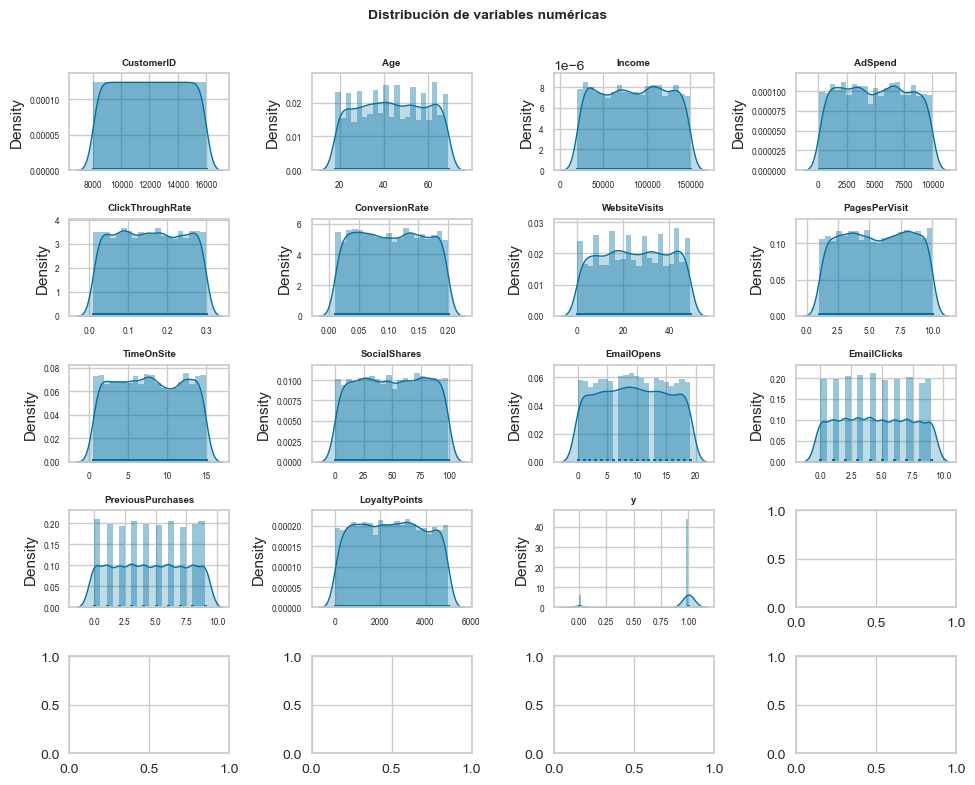

In [10]:
fig, axes = pyplot.subplots(nrows=5, ncols=4, figsize=(10, 8))
axes = axes.flat
columnas_numeric = dataset.select_dtypes(include=['float64', 'int64']).columns
for i, colum in enumerate(columnas_numeric):
    sns.distplot(dataset[colum], hist= True, rug = True,
                 kde_kws = {'shade': True, 'linewidth': 1}, ax  = axes[i] )
    axes[i].set_title(colum, fontsize = 7, fontweight = "bold")
    axes[i].tick_params(labelsize = 6)
    axes[i].set_xlabel("")
    
fig.tight_layout()
pyplot.subplots_adjust(top = 0.9)
fig.suptitle('Distribución de variables numéricas', fontsize = 10, fontweight = "bold");

### 1.3.2- Distribución de las variables numéricas frente a la variable objetivo <br>
Teniendo en cuenta el desbalanceo de la variable objetivo, vemos las distribuciones de las variables numéricas respecto a la y<br>
Normalizamos las gráficas para una mejor visualización, entendiendo el ya existente desbalanceo. Como resumen: <br>
* Edad: hay menos densidad para los no compradores en las edades entorno a los 40, y entre 65 y 70 años. <br>
* Género: menor densidad de hombres, y menor densidad de no compradores. <br>
* Ingresos: distribución ligeramente superior en los usuarios compradores. <br>
* Gasto de campaña: los no compradores son asimétricos en torno a los 2000$, y el gasto es notablemente superior en los compradores, desde los 6000$ <br>
* ClickThroughRate: los no compradores son asimétricos en torno a ratios de click bajos. Parece que los compradores tienen ratios de click más altos.<br>
* ConversionRate: los no compradores son asimétricos en torno a ratios de conversión bajos. Parece que los compradores tienen ratios de conversión más altos.<br>
* WebSiteVisits: los no compradores tienen altas densidades en torno a bajas visitas a la web. Parece que los compradores visitan más la web.<br>
* PagesPerVisit: misma tendencia que indicadores anteriores: los no compradores tienen más densidades en menos páginas por visita. <br>
* TimeOnsite: los compradores pasan más tiempo en el site que los no compradores. <br>
* SocialShares: las densidades son parecidas entre compradores y no compradores, aunque los no compradores tienen un pico alrededor de los 50. <br>
* EmailOpens: los compradores tienen mayores densidades de aperturas altas que los no compradores. <br>
* EmailClicks, PreviousPurchases y LoyaltyPoints: lso compradores tienen densidades más altas en los valores más altos. <br>

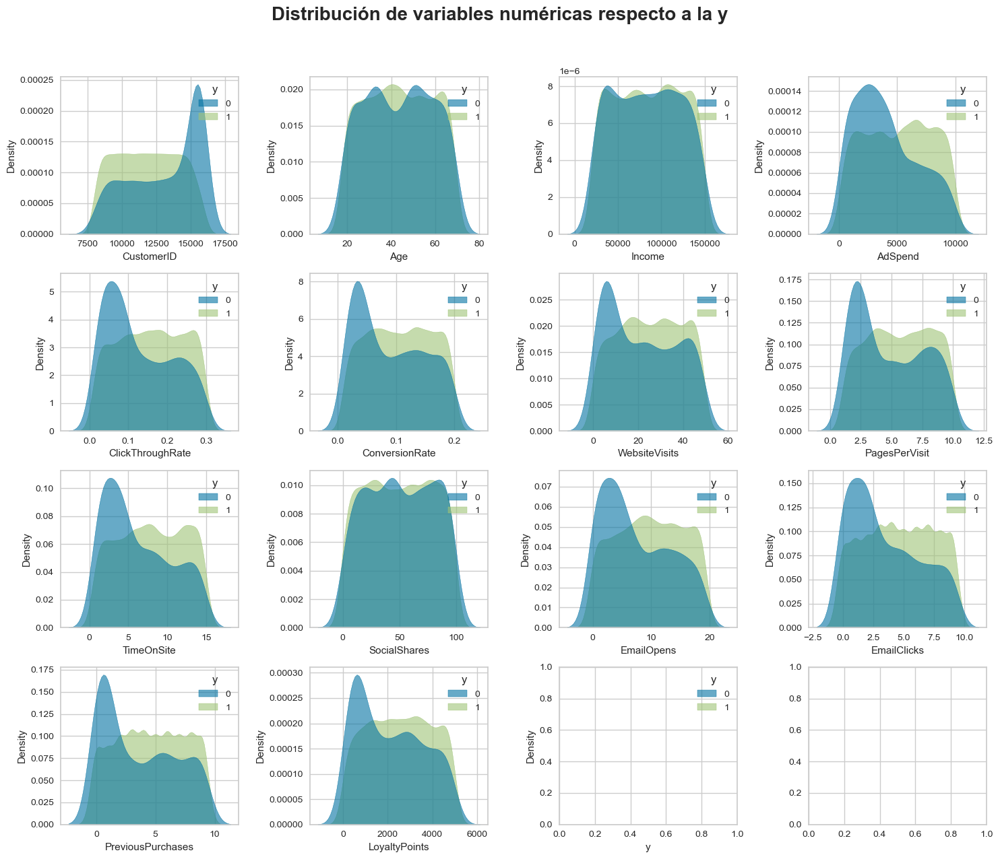

In [11]:
#  plot Numerical Data
a = 4  # 4 filas
b = 4  # 4 columnas
c = 1  # contador de plot

fig, axes = pyplot.subplots(nrows=4, ncols=4, figsize=(15, 13))
axes = axes.flat

for i in columnas_numeric:
    pyplot.subplot(a, b, c)
    pyplot.xlabel(i)
    sns.kdeplot(data = dataset, x = i, hue ='y', fill=True, common_norm=False, alpha=0.6, gridsize=80)
    c = c + 1

pyplot.tight_layout()
pyplot.subplots_adjust(top = 0.9)
fig.suptitle('Distribución de variables numéricas respecto a la y', fontsize = 20, fontweight = "bold");


###  1.3.3.- Distribución de variables categóricas: <br>
* Gender: para el género "Male", los valores de la y están menos representados que para el género "Female". <br>
* CampaignChannels: los valores se distribuyen de una manera más o menos homogénea, entre el 19% y el 21% de registros en cada categoría. <br>
* CampaignType: también se distribuyen de una manera equilibrada, entre el 24% y el 26% de registros por categoría. <br>
* En cuanto a cómo se distribuyen las categorías en función de la variable objetivo, la categoría de CampaignType = Conversion tiene infrarrepresentación para los valores de y=0 respecto al resto de categorías: 138/1.016 = 13.6%, frente al resto de categorías que están en torno al 28%. 


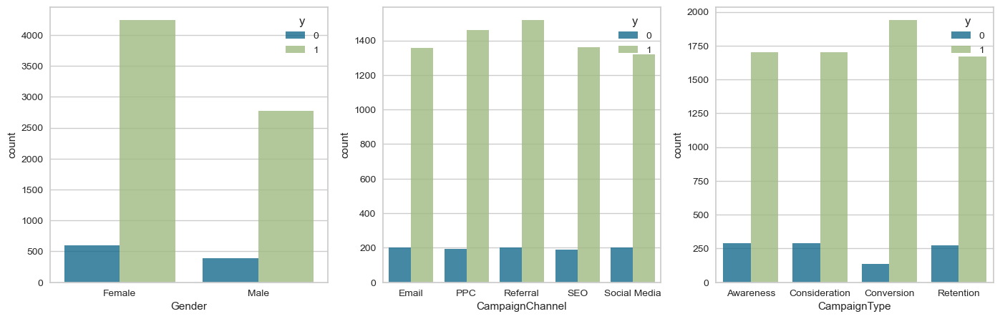

In [12]:
columnas_cat = dataset[['Gender', 'CampaignChannel', 'CampaignType' ]]

fig , ax = pyplot.subplots(1,3,figsize = (17,5))   
for i , subplots in zip (columnas_cat, ax.flatten()):  
  sns.countplot(x=columnas_cat[i], hue = dataset['y'], data = dataset, ax = subplots, palette = None, alpha=0.8)
pyplot.show()

In [13]:
print('Distribución de la y por género: \n')
pd.crosstab(dataset.y, dataset.Gender, normalize=True)


Distribución de la y por género: 



Gender,Female,Male
y,,
0,0.074875,0.048625
1,0.530000,0.346500


In [14]:
print('Distribución de la y por CampaignChannel: \n')
pd.crosstab(dataset.y, dataset.CampaignChannel, normalize=True)

Distribución de la y por CampaignChannel: 



CampaignChannel,Email,PPC,Referral,SEO,Social Media
y,,,,,
0,0.025250,0.024250,0.025125,0.023875,0.025000
1,0.169375,0.182625,0.189750,0.169875,0.164875


In [15]:
print('Distribución de la y por CampaignType: \n')
pd.crosstab(dataset.y, dataset.CampaignType, normalize=True)

Distribución de la y por CampaignType: 



CampaignType,Awareness,Consideration,Conversion,Retention
y,,,,
0,0.035875,0.035875,0.017250,0.034500
1,0.212625,0.212625,0.242375,0.208875


## 1.4 Incidencia y gestión de outliers <br>
* No se observan valores atípicos en las variables numéricas

In [16]:
# Creamos dos variables de control para evaluar los efectos de las variables predictoras sobre la variable objetivo

dataset['aleatorio'] = np.random.uniform(0,1,size=dataset.shape[0])
dataset['aleatorio2'] = np.random.uniform(0,1,size=dataset.shape[0])

In [17]:
# Los valores atípicos y faltantes se trabajan solo de las variables input, no de la objetivo. Dividimos el dataset, que luego también usaremos
varObj = dataset.y 
imput = dataset.drop(['CustomerID', 'y'],axis=1)


In [18]:
# No existen asimetrías en las variables numéricas, con lo que no tenemos problemas de valores atípicos.
imput.select_dtypes(include=np.number).apply(lambda x: x.skew())

Age                 -0.004916
Income              -0.011298
AdSpend              0.019224
ClickThroughRate     0.011066
ConversionRate       0.012777
WebsiteVisits       -0.017139
PagesPerVisit       -0.012510
TimeOnSite           0.014610
SocialShares        -0.011357
EmailOpens           0.007679
EmailClicks          0.023366
PreviousPurchases    0.005712
LoyaltyPoints        0.016303
aleatorio            0.007599
aleatorio2           0.020283
dtype: float64

## 1.5 Existencia de valores perdidos: <br>
Como hemos comprobado anteriormente con la librería ydata_profiling, no existen valores faltantes.

In [19]:
#Proporción de missings por variable 
dataset.apply(lambda x: x.isna().sum()/dataset.shape[0]*100)

CustomerID           0.0
Age                  0.0
Gender               0.0
Income               0.0
CampaignChannel      0.0
CampaignType         0.0
AdSpend              0.0
ClickThroughRate     0.0
ConversionRate       0.0
WebsiteVisits        0.0
PagesPerVisit        0.0
TimeOnSite           0.0
SocialShares         0.0
EmailOpens           0.0
EmailClicks          0.0
PreviousPurchases    0.0
LoyaltyPoints        0.0
y                    0.0
aleatorio            0.0
aleatorio2           0.0
dtype: float64

## 1.6 Imputaciones: <br>
Existen 362 registros que tienen EmailOpens = 0 y EmailClicks distintos de cero, lo que es incongruente. Para corregir esos registros, recalculamos el campo EmailOpens ayudándonos de la columna ClickTroughRate, de manera que EmailOpens(0) = EmailClicks / ClickTroughRate. <br>
Finalmente, nos quedamos con 41 registros que tienen EmailOpens = 0 y EmailClicks = 0 <br>

Al aplicar dicha transformación, el número de valores posibles del campo EmailOpens ha aumentado, y se han generado valores extremos. Para corregir estos outliers, les asignamos el mayor valor de la serie, que es 19.

In [20]:
# Consultamos
dataset.loc[(dataset['EmailOpens'] == 0) & (dataset['EmailClicks'] != 0)].count()


CustomerID           362
Age                  362
Gender               362
Income               362
CampaignChannel      362
CampaignType         362
AdSpend              362
ClickThroughRate     362
ConversionRate       362
WebsiteVisits        362
PagesPerVisit        362
TimeOnSite           362
SocialShares         362
EmailOpens           362
EmailClicks          362
PreviousPurchases    362
LoyaltyPoints        362
y                    362
aleatorio            362
aleatorio2           362
dtype: int64

In [21]:
# Consultamos
dataset.loc[(dataset['EmailOpens'] == 0) & (dataset['EmailClicks'] == 0)].count()

CustomerID           41
Age                  41
Gender               41
Income               41
CampaignChannel      41
CampaignType         41
AdSpend              41
ClickThroughRate     41
ConversionRate       41
WebsiteVisits        41
PagesPerVisit        41
TimeOnSite           41
SocialShares         41
EmailOpens           41
EmailClicks          41
PreviousPurchases    41
LoyaltyPoints        41
y                    41
aleatorio            41
aleatorio2           41
dtype: int64

In [22]:
# Aplicamos la fórmula de imputación de los valores incongruentes para EmailOpens=0
dataset.loc[dataset['EmailOpens'] == 0, 'EmailOpens'] = round((dataset.EmailClicks / dataset.ClickThroughRate), 0)

In [23]:
dataset.describe()

,CustomerID,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,y,aleatorio,aleatorio2
count,8000.00000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,11999.50000,43.625500,84664.196750,5000.944830,0.154829,0.104389,24.751625,5.549299,7.727718,49.799750,11.872500,4.467375,4.485500,2490.268500,0.876500,0.499965,0.498914
std,2309.54541,14.902785,37580.387945,2838.038153,0.084007,0.054878,14.312269,2.607358,4.228218,28.901165,18.748118,2.856564,2.888093,1429.527162,0.329031,0.289372,0.290020
min,8000.00000,18.000000,20014.000000,100.054813,0.010005,0.010018,0.000000,1.000428,0.501669,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000038,0.000040
25%,9999.75000,31.000000,51744.500000,2523.221165,0.082635,0.056410,13.000000,3.302479,4.068340,25.000000,5.000000,2.000000,2.000000,1254.750000,1.000000,0.245983,0.251109
50%,11999.50000,43.000000,84926.500000,5013.440044,0.154505,0.104046,25.000000,5.534257,7.682956,50.000000,10.000000,4.000000,4.000000,2497.000000,1.000000,0.500780,0.495281
75%,13999.25000,56.000000,116815.750000,7407.989369,0.228207,0.152077,37.000000,7.835756,11.481468,75.000000,15.000000,7.000000,7.000000,3702.250000,1.000000,0.751877,0.755961
max,15999.00000,69.000000,149986.000000,9997.914781,0.299968,0.199995,49.000000,9.999055,14.995311,99.000000,466.000000,9.000000,9.000000,4999.000000,1.000000,0.999916,0.999905


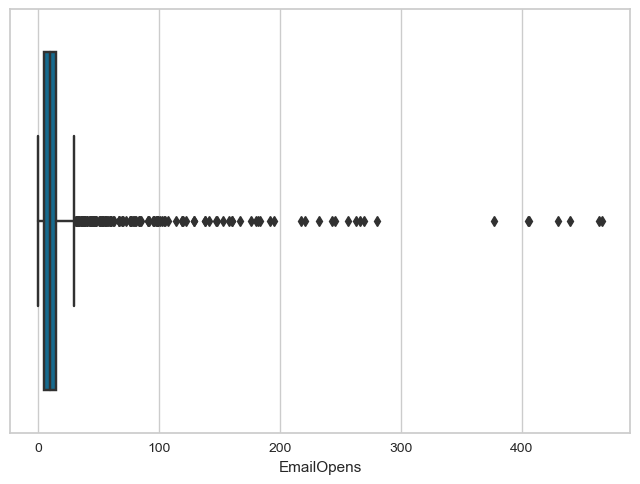

In [24]:
ax = sns.boxplot(x="EmailOpens", data=dataset)

In [25]:
# Para corregir esos registros, les asignamos el valor máximo de la variable EmailOpens antes de realizar la transformación: 19
dataset['EmailOpens'].loc[(dataset["EmailOpens"] > 19)] = 19


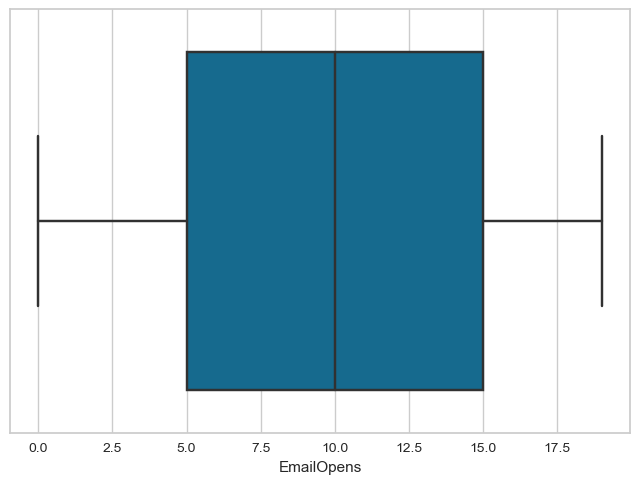

In [26]:
ax = sns.boxplot(x="EmailOpens", data=dataset)

## 1.7- Análisis inicial de las relaciones de las variables con la objetivo: V de Cramer<br>
La V de Cramer mide la asociación entre dos variables nominales, y su valor está entre 0 y 1 (existiendo poca asociación entre las variables para valores cercanos a cero, y alta asociación para valores cercanos a 1). No obstante, para las variables numéricas, las tramificamos en 5 tramos, para que sean tratadas como categóricas.<br>

Tras ejecutar una tabla de contingencia con el método V de Cramer, parece que la variable que más influye en la conversion es "PreviousPurchases", seguida de "PagesPerVisit", "EmailOpens", "ConversionRate", "TimeOnsite", "EmailClicks", "LoyaltyPoints", "ClickThroughRate", WebSiteVisits" y "Adspend". <br>
Las variables que menos relación tienen, son "Age", "Income", "Campaignchannel", "SocialShares" y "Gender". <br>
"Social Shares" y "Gender" están por debajo de las variables aleatorias, con lo que vamos a prescindir de ellas. <br>

Ejecutamos también las correlaciones entre las variables numéricas y la variable objetivo: aunque varían los valores, el resultado confirma la variables obtenidas con la V de Cramer.

In [27]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   CustomerID         8000 non-null   int64   
 1   Age                8000 non-null   int64   
 2   Gender             8000 non-null   category
 3   Income             8000 non-null   int64   
 4   CampaignChannel    8000 non-null   category
 5   CampaignType       8000 non-null   category
 6   AdSpend            8000 non-null   float64 
 7   ClickThroughRate   8000 non-null   float64 
 8   ConversionRate     8000 non-null   float64 
 9   WebsiteVisits      8000 non-null   int64   
 10  PagesPerVisit      8000 non-null   float64 
 11  TimeOnSite         8000 non-null   float64 
 12  SocialShares       8000 non-null   int64   
 13  EmailOpens         8000 non-null   int64   
 14  EmailClicks        8000 non-null   int64   
 15  PreviousPurchases  8000 non-null   int64   
 16  Loyalt

In [28]:
# Aplicamos la función  V DE CREAMER al input completo contra la objetivo
tablaCramer = pd.DataFrame(imput.apply(lambda x: cramers_v(x,varObj)),columns=['VCramer'])

# Obtenemos el gráfico de importancia de las variables frente a la objetivo continua según vcramer
px.bar(tablaCramer,x=tablaCramer.VCramer, title='Relaciones frente a la conversión', text_auto=True).update_yaxes(categoryorder="total ascending", automargin="left").show()


In [29]:
# Matriz de correlaciones
corr = dataset.select_dtypes(include=np.number).corr()
corr.style.background_gradient(cmap='YlOrRd').format(precision=3)


,CustomerID,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,y,aleatorio,aleatorio2
CustomerID,1.000,-0.004,0.002,0.016,0.005,0.010,0.000,0.000,-0.014,-0.012,-0.004,-0.004,-0.013,-0.023,-0.181,0.007,0.001
Age,-0.004,1.000,0.009,-0.005,0.012,0.020,-0.002,-0.009,-0.013,-0.010,0.017,0.009,-0.007,0.014,0.002,0.009,0.005
Income,0.002,0.009,1.000,0.004,0.008,0.018,-0.003,0.004,0.019,-0.006,-0.012,0.009,-0.012,-0.007,0.014,0.011,-0.019
AdSpend,0.016,-0.005,0.004,1.000,-0.008,-0.020,0.007,-0.009,-0.004,-0.021,0.021,0.001,0.002,0.002,0.125,0.005,-0.001
ClickThroughRate,0.005,0.012,0.008,-0.008,1.000,-0.008,-0.023,0.000,-0.008,-0.013,-0.015,-0.011,-0.000,-0.017,0.120,0.011,0.001
ConversionRate,0.010,0.020,0.018,-0.020,-0.008,1.000,-0.012,0.019,0.009,0.009,0.006,0.007,-0.023,-0.000,0.093,0.000,0.009
WebsiteVisits,0.000,-0.002,-0.003,0.007,-0.023,-0.012,1.000,-0.012,-0.022,0.000,0.008,0.003,0.014,0.003,0.079,0.010,0.013
PagesPerVisit,0.000,-0.009,0.004,-0.009,0.000,0.019,-0.012,1.000,0.016,0.008,-0.002,-0.000,-0.016,-0.013,0.103,0.031,-0.007
TimeOnSite,-0.014,-0.013,0.019,-0.004,-0.008,0.009,-0.022,0.016,1.000,0.002,-0.004,0.002,-0.006,-0.011,0.130,0.001,-0.012
SocialShares,-0.012,-0.010,-0.006,-0.021,-0.013,0.009,0.000,0.008,0.002,1.000,-0.012,0.003,-0.013,-0.005,-0.011,0.001,0.005


In [30]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   CustomerID         8000 non-null   int64   
 1   Age                8000 non-null   int64   
 2   Gender             8000 non-null   category
 3   Income             8000 non-null   int64   
 4   CampaignChannel    8000 non-null   category
 5   CampaignType       8000 non-null   category
 6   AdSpend            8000 non-null   float64 
 7   ClickThroughRate   8000 non-null   float64 
 8   ConversionRate     8000 non-null   float64 
 9   WebsiteVisits      8000 non-null   int64   
 10  PagesPerVisit      8000 non-null   float64 
 11  TimeOnSite         8000 non-null   float64 
 12  SocialShares       8000 non-null   int64   
 13  EmailOpens         8000 non-null   int64   
 14  EmailClicks        8000 non-null   int64   
 15  PreviousPurchases  8000 non-null   int64   
 16  Loyalt

In [31]:
# Borramos las variables aleatorias
dataset = dataset.drop(['aleatorio', 'aleatorio2'], axis=True)

# 2- TRANSFORMACIONES DE VARIABLES 

## 2.1 Transformaciones en las variables numéricas: <br> 
- Ejecutamos la función precargada que nos busca la mejor transformación de las variables numéricas, para maximizar las relaciones con la variable objetivo. Mediante el gráfico de barras, vemos que no cambian significativamente las distribuciones de las variables aplicando transformaciones matemáticas, con lo que no las transformaremos.

In [32]:
# Aplicar a las variables continuas la mejor transformación según cramer frente a varObjBin
transf_cramer = imput.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObj, tipo='cramer'))
transf_cramer_names = imput.select_dtypes(include=np.number).apply(lambda x: mejorTransf(x,varObj,tipo='cramer', name=True))
transf_cramer.columns = transf_cramer_names.values
transf_cramer.head()

,Age_ident,Income_log,AdSpend_raiz4,ClickThroughRate_sqrt,ConversionRate_ident,WebsiteVisits_ident,PagesPerVisit_ident,TimeOnSite_ident,SocialShares_cuarta,EmailOpens_sqrt,EmailClicks_sqrt,PreviousPurchases_sqrt,LoyaltyPoints_ident,aleatorio_exp,aleatorio2_raiz4
0,2.550118,1.134914,1.225364,0.635472,1.421764,0.000100,0.536534,1.630944,1.869502e-01,1.025061,1.775088,1.176938,0.481408,4.154938,1.117334
1,3.422493,-0.546817,1.075639,1.317127,3.147386,2.934829,0.735262,1.147435,8.981130e-04,0.591875,1.565487,0.832251,2.419932,5.653500,0.629616
2,1.879061,0.599622,0.844975,1.784482,1.210216,0.139849,2.770584,3.144229,1.000000e-16,1.387909,0.836831,1.664412,1.635008,14.989649,1.278610
3,0.939580,-0.445256,0.627415,1.232554,1.421268,3.284201,1.358077,3.355551,8.996294e+01,0.591875,0.836831,0.010000,1.723155,4.558102,1.272633
4,2.818541,0.531740,0.863570,1.700312,1.821012,0.000100,0.401458,3.191171,1.861610e-03,1.025061,1.449364,1.664412,3.039757,11.838632,0.750623


In [33]:
# Generar input con tranformaciones
imput_transf = imput.join(transf_cramer)

# Aplicar la función al input completo contra la objetivo
tablaCramer = pd.DataFrame(imput_transf.apply(lambda x: cramers_v(x,varObj)),columns=['VCramer'])

# Obtener el gráfico de importancia de las variables frente a la objetivo continua según vcramer
px.bar(tablaCramer,x=tablaCramer.VCramer,title='Relaciones frente a Compra tras efectuar Transformaciones en las variables', text_auto=True).update_yaxes(categoryorder="total ascending", automargin="left").show()

# 3- ENFOQUE ESTADÍSTICO: MODELIZACIÓN DE UNA REGRESIÓN LOGÍSTICA <br>
Antes de empezar con la partición del dataset en entrenamiento y test, recordamos que la variable objetivo presenta un importante desbalance en favor del valor 1. Esto es muiy importante, ya que el modelo tendrá problemas en detectar los valores 0.

In [34]:
dataset.y.value_counts(normalize=True)

y
1    0.8765
0    0.1235
Name: proportion, dtype: float64

## 3.1- Partición en training y test: <br>
El dataset de entrenamiento tiene 6400 registros, tanto para las x como para las y. <br>
El dataset de test tiene 1600 registros. <br>
La proporción de los valores de la variable objetivo en Training y en Test se ha mantenido casi al 100%. <br>


In [35]:
# Borramos las variables aleatorias
imput = imput.drop(['aleatorio', 'aleatorio2'], axis=True)

In [36]:
imput.head()

,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints
0,56,Female,136912,Social Media,Awareness,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688
1,69,Male,41760,Email,Retention,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459
2,46,Female,88456,PPC,Awareness,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337
3,32,Female,44085,PPC,Conversion,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463
4,60,Female,83964,PPC,Conversion,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345


In [37]:
# Creamos 4 objetos: predictores para training y test y variable objetivo para training y test. 
X_train, X_test, y_train, y_test = train_test_split(imput, varObj, test_size=0.2, random_state=1234)

# Comprobamos dimensiones
print('Tamaño dataset Training:', X_train.shape, y_train.shape)

Tamaño dataset Training: (6400, 16) (6400,)


In [38]:
print('Tamaño dataset Test:', X_test.shape, y_test.shape)

Tamaño dataset Test: (1600, 16) (1600,)


In [39]:
print('Proporción de la variable y en Training: \n', y_train.value_counts(normalize=True))
print('Proporción de la variable y en Test: \n', y_test.value_counts(normalize=True))

Proporción de la variable y en Training: 
 y
1    0.875156
0    0.124844
Name: proportion, dtype: float64
Proporción de la variable y en Test: 
 y
1    0.881875
0    0.118125
Name: proportion, dtype: float64


In [40]:
# Juntamos los sets de entrenamiento de las variables explicativas y la objetivo:
data_train = X_train.join(y_train)
data_test = X_test.join(y_test)


In [41]:
data_train.head()

,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,y
7913,26,Female,68101,SEO,Awareness,2341.264994,0.192814,0.196405,6,8.633817,6.011775,51,9,1,3,3858,0
4159,47,Female,27712,PPC,Retention,4694.490316,0.281357,0.055738,27,2.645470,7.275138,27,8,8,2,3038,1
1095,29,Female,138335,PPC,Retention,4630.231395,0.225392,0.164624,21,4.256073,0.611445,23,4,7,2,2258,1
1517,23,Female,104268,Social Media,Awareness,5118.627824,0.154847,0.167690,16,3.059855,7.188347,60,0,5,2,810,1
7256,67,Female,135117,Referral,Awareness,3985.260088,0.181159,0.187129,10,9.346901,11.452100,9,16,2,2,2830,1


## 3.2- Creación del modelo completo

In [42]:
# Aplicamos a fórmula de modelo completo
formC=ols_formula(data_train,'y')
formC

'y ~ Age + Gender + Income + CampaignChannel + CampaignType + AdSpend + ClickThroughRate + ConversionRate + WebsiteVisits + PagesPerVisit + TimeOnSite + SocialShares + EmailOpens + EmailClicks + PreviousPurchases + LoyaltyPoints'

In [43]:
# One-hot encoding: convertimos las variables categóricas en numéricas, y generamos las matrices de diseño según la fórmula de modelo completo.
y_tr, X_tr = patsy.dmatrices(formC, data_train, return_type='dataframe')

# Generamos las matrices de diseño según la fórmula de modelo completo para test
y_tst, X_tst = patsy.dmatrices(formC, data_test, return_type='dataframe')

In [44]:
X_tst.head()

,Intercept,Gender[T.Male],CampaignChannel[T.PPC],CampaignChannel[T.Referral],CampaignChannel[T.SEO],CampaignChannel[T.Social Media],CampaignType[T.Consideration],CampaignType[T.Conversion],CampaignType[T.Retention],Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints
260,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,46.0,134540.0,2901.619193,0.010514,0.097585,18.0,5.903688,12.801602,34.0,18.0,6.0,9.0,3545.0
1058,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20.0,46807.0,1585.220274,0.274860,0.125714,4.0,4.229105,14.842299,21.0,17.0,2.0,9.0,2928.0
1111,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,55391.0,5134.338413,0.104862,0.146128,47.0,6.422417,10.728618,27.0,0.0,0.0,3.0,4636.0
3437,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,38.0,124004.0,1713.868204,0.082880,0.173819,16.0,5.785800,6.672814,95.0,19.0,6.0,9.0,1835.0
5021,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,45.0,73054.0,7026.591003,0.244097,0.138882,15.0,9.488643,2.301075,47.0,16.0,7.0,4.0,4626.0


## 3.3- Métricas de evaluación del modelo: <br>
Tras ejecutar el modelo en training, hacemos las predicciones en test y obtenemos las métricas que nos van a ayudar en la elección de nuestro modelo: 
* PseudoR: 0.1988, sería equiparable a un un 40% en una regresión lineal. El modelo explica el 40% de la variabilidad de la y.
* La exactitud (accuracy) del modelo para clasificar correctamente es de un 90%. 
* La matriz de confusión nos da: 47 verdaderos 0, 1398 verdaderos 1, 142 falsos 1, 13 falsos 0
* Para la clase 0 (No conversión):
    * Precisión de la clase 0: predicciones correctas de la clase 0 / total de predicciones de la clase 0 --> 78%. El modelo ha predicho 60 y ha acertado 47.
    * Recall: predicciones correctas de la clase 0 / registros reales de la clase 0 --> 25%. El modelo ha predicho bien 47 de 189 registros con 0.
    * F1-Score: 38% --> el modelo no detecta bien la clase 0.
* Para la clase 1 (Conversión):
    * Precisión de la clase 1: predicciones correctas de la clase 1 / total de predicciones de la clase 1 --> 91%. El modelo ha predicho 1540 y ha acertado 1398.
    * Recall: predicciones correctas de la clase 1 / registros reales de la clase 1 --> 99%. El modelo ha predicho bien 1398 de 1412 registros con 1.
    * F1-Score: 95% --> el modelo detecta muy bien la clase 1

* Área bajo la curva roc: 1> 0.81> 0.5 --> modelo relativamente bueno. Es mejor que el "no modelo".
* No obstante, nos encontramos con una capacidad de predicción de los 0 casi nula.

Los 4 escenarios que se nos presentan son los siguientes: <br>
* Alta precision y alto recall: el modelo maneja perfectamente esa clase. Se trata de un buen modelo de clasificación para poder implementar en nuestro proyecto.
* Alta precision y bajo recall: el modelo no detecta la clase «perseguida» muy bien, pero cuando lo hace es altamente confiable.
* Baja precisión y alto recall: El algoritmos detecta bien la clase «perseguida» pero también incluye muestras de la/s otra/s clase/s.
* Baja precisión y bajo recall: El modelo no logra clasificar la clase correctamente. No sería bueno seguir adelante con la implementación de dicho modelo.

Como resumen: nos encontramos con un modelo que tiene:
* Para las "No conversiones": alta precisión y bajo recall: el modelo no detecta la clase bien, pero cuando lo hace, es altamente confiable.
* Para las "Conversiones": alta precisión y alto recall: el modelo maneja muy bien la clase=1

Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones 0.89046875


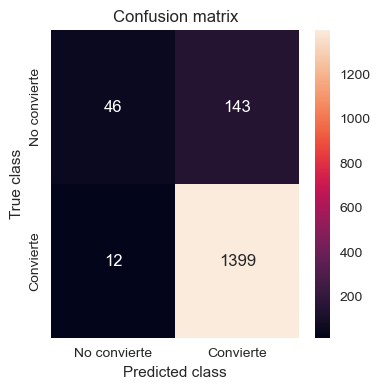

              precision    recall  f1-score   support

         0.0       0.79      0.24      0.37       189
         1.0       0.91      0.99      0.95      1411

    accuracy                           0.90      1600
   macro avg       0.85      0.62      0.66      1600
weighted avg       0.89      0.90      0.88      1600



In [45]:
# Definición de modelo: hay muchos solver, python usa por defecto éste. Aplicamos el solver newton-cg porque es el que nos da valores más altos de las métricas
modelo1 = LogisticRegression(solver='newton-cg', max_iter=1000, penalty=None)

# Arreglar y para que le guste a sklearn...numeric, creo un data set nuevo
y_tr_ = y_tr.y.ravel()

# Ajuste de modelo
modelLog = modelo1.fit(X_tr,y_tr)

# Accuracy del modelo en training: el score da la tasa de acierto: el modelo clafisica correctamente el 87,5% de las observaciones
acc = modelLog.score(X_tr,y_tr)
print('Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones', acc)

# Predicciones en test
y_pred = modelLog.predict(X_tst)

mostrar_matriz(y_tst, y_pred)

Curva ROC:  0.7949474425606549
Sin entrenar: ROC AUC=0.500
Regresión Logística: ROC AUC=0.815


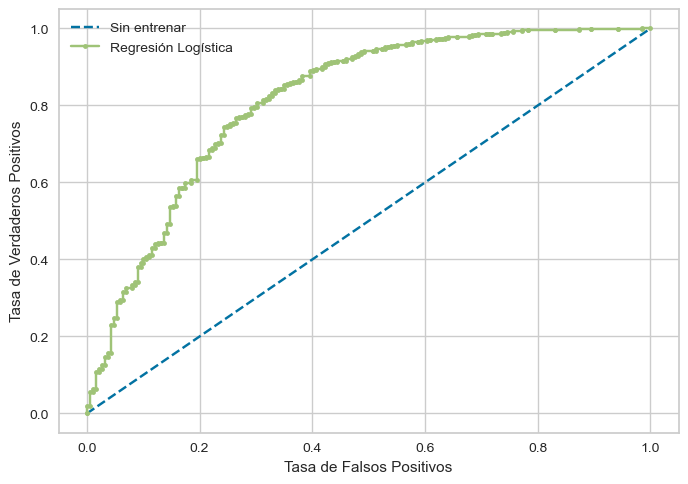

In [46]:
# Extraemos el Area bajo la curva ROC, porque ayuda mucho cuando hay desbalance entre 0 y 1
print('Curva ROC: ', metrics.roc_auc_score(y_tr_, modelLog.predict_proba(X_tr)[:, 1]))
curva_roc(y_tst, y_pred, modelLog, X_tst)

In [47]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(modelLog.score(X_tr, y_tr_)))
print('Test set score: {:.4f}'.format(modelLog.score(X_tst, y_tst)))

Training set score: 0.8905
Test set score: 0.9031


In [48]:
# Ajusto regresión de ejemplo para sacar los coeficientes. Lo hacemos una única vez con este modelo sólo, por no saturar
modelLogCompleto = logit(formC,data=data_train).fit()

Optimization terminated successfully.
         Current function value: 0.301659
         Iterations 7


In [49]:
modelLogCompleto.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                 6400
Model:                          Logit   Df Residuals:                     6378
Method:                           MLE   Df Model:                           21
Date:                Thu, 29 Aug 2024   Pseudo R-squ.:                  0.1987
Time:                        12:20:40   Log-Likelihood:                -1930.6
converged:                       True   LL-Null:                       -2409.4
Covariance Type:            nonrobust   LLR p-value:                3.102e-189
===================================================================================================
                                      coef    std err          z      P>|z|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept                          -5.0024      0.326    -15.324      0.000      -5.642      -4.363
Gender[T.Male]                     -0.0277      0.085     -0.326      0.745      -0.195       0.139
CampaignChannel[T.PPC]              0.2898      0.133      2.185      0.029       0.030       0.550
CampaignChannel[T.Referral]         0.2390      0.131      1.827      0.068      -0.017       0.496
CampaignChannel[T.SEO]              0.1580      0.132      1.198      0.231      -0.101       0.417
CampaignChannel[T.Social Media]    -0.0379      0.131     -0.290      0.772      -0.294       0.218
CampaignType[T.Consideration]       0.0605      0.111      0.547      0.585      -0.156       0.277
CampaignType[T.Conversion]          1.0148      0.131      7.761      0.000       0.759       1.271
CampaignType[T.Retention]           0.0621      0.112      0.553      0.580      -0.158       0.282
Age                                -0.0013      0.003     -0.455      0.649      -0.007       0.004
Income                           2.255e-07   1.11e-06      0.203      0.839   -1.96e-06    2.41e-06
AdSpend                             0.0002   1.52e-05      9.956      0.000       0.000       0.000
ClickThroughRate                    5.5356      0.516     10.736      0.000       4.525       6.546
ConversionRate                      5.9802      0.781      7.661      0.000       4.450       7.510
WebsiteVisits                       0.0206      0.003      7.020      0.000       0.015       0.026
PagesPerVisit                       0.1458      0.016      8.882      0.000       0.114       0.178
TimeOnSite                          0.1165      0.010     11.266      0.000       0.096       0.137
SocialShares                       -0.0016      0.001     -1.082      0.279      -0.004       0.001
EmailOpens                          0.0809      0.008     10.624      0.000       0.066       0.096
EmailClicks                         0.1798      0.016     11.589      0.000       0.149       0.210
PreviousPurchases                   0.1273      0.015      8.607      0.000       0.098       0.156
LoyaltyPoints                       0.0003   2.98e-05      8.782      0.000       0.000       0.000
===================================================================================================
"""

## 3.4- Proceso de backward para retirar variables del modelo y mejorarlo: MODELO 2
Eliminamos las variables que no tiene un p-valor significativo, y volvemos a ejecutar el modelo en training, hacemos las predicciones en test y obtenemos las métricas que nos van a ayudar en la elección de nuestro modelo: La variable CampaignChannel es la que provoca esta mínima disminución.
* PseudoR: 0.1964, sería equiparable a un un 39% en una regresión lineal. El modelo explica el 39% de la variabilidad de la y, inferior al modelo anterior.
* La exactitud (accuracy) del modelo para clasificar correctamente es de un 90%: se mantiene respecto al modelo anterior. 
* La matriz de confusión nos da: 44 verdaderos 0, 1403 verdaderos 1, 145 falsos 1, 8 falsos 0
* Para la clase 0 (No conversión):
    * Precisión de la clase 0: predicciones correctas de la clase 0 / total de predicciones de la clase 0 --> 85%. El modelo ha predicho 52 y ha acertado 44.
    * Recall: predicciones correctas de la clase 0 / registros reales de la clase 0 --> 23%. El modelo ha predicho bien 44 de 189 registros con 0. Cae 2 pp respecto al modelo anterior.
    * F1-Score: 37% --> el modelo detecta 1pp peor la clase 0 que el modelo anterior.
* Para la clase 1 (Conversión):
    * Precisión de la clase 1: predicciones correctas de la clase 1 / total de predicciones de la clase 1 --> 91%. El modelo ha predicho 1548 y ha acertado 1403. Mejora respecto al modelo anterior.
    * Recall: predicciones correctas de la clase 1 / registros reales de la clase 1 --> 99%. El modelo ha predicho bien 1403 de 1411 registros con 1.
    * F1-Score: 95% --> el modelo detecta bien la calse 1.

* Área bajo la curva roc: 1> 0.81> 0.5 --> modelo relativamente bueno. Es mejor que el "no modelo" y muy levemente que el modelo anterior.
* No obstante, seguimos con una capacidad de predicción de los ceros muy baja. Haremos oversampling con este modelo.



In [50]:
# Creamos datasets nuevos eliminando las variables no representativas
data_train2 = data_train.drop(['Age','Gender', 'Income', 'SocialShares', 'CampaignChannel'], axis = 1)
data_test2 = data_test.drop(['Age','Gender', 'Income', 'SocialShares', 'CampaignChannel'], axis = 1)



In [51]:
# Aplicamos a fórmula de modelo eliminando las variables que descartamos
form2=ols_formula(data_train2,'y')
form2

'y ~ CampaignType + AdSpend + ClickThroughRate + ConversionRate + WebsiteVisits + PagesPerVisit + TimeOnSite + EmailOpens + EmailClicks + PreviousPurchases + LoyaltyPoints'

In [52]:
# One-hot encoding: convertimos las variables categóricas en numéricas, y g eneramos las matrices de diseño según la fórmula de modelo completo.
y_tr2, X_tr2 = patsy.dmatrices(form2, data_train2, return_type='dataframe')

# Generamos las matrices de diseño según la fórmula de modelo completo para test
y_tst2, X_tst2 = patsy.dmatrices(form2, data_test2, return_type='dataframe')

In [53]:
X_tr2.head()

,Intercept,CampaignType[T.Consideration],CampaignType[T.Conversion],CampaignType[T.Retention],AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints
7913,1.0,0.0,0.0,0.0,2341.264994,0.192814,0.196405,6.0,8.633817,6.011775,9.0,1.0,3.0,3858.0
4159,1.0,0.0,0.0,1.0,4694.490316,0.281357,0.055738,27.0,2.645470,7.275138,8.0,8.0,2.0,3038.0
1095,1.0,0.0,0.0,1.0,4630.231395,0.225392,0.164624,21.0,4.256073,0.611445,4.0,7.0,2.0,2258.0
1517,1.0,0.0,0.0,0.0,5118.627824,0.154847,0.167690,16.0,3.059855,7.188347,0.0,5.0,2.0,810.0
7256,1.0,0.0,0.0,0.0,3985.260088,0.181159,0.187129,10.0,9.346901,11.452100,16.0,2.0,2.0,2830.0


Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones 0.88984375


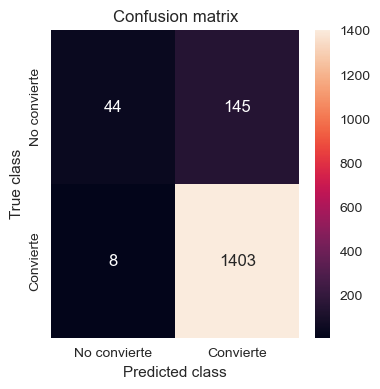

              precision    recall  f1-score   support

         0.0       0.85      0.23      0.37       189
         1.0       0.91      0.99      0.95      1411

    accuracy                           0.90      1600
   macro avg       0.88      0.61      0.66      1600
weighted avg       0.90      0.90      0.88      1600



In [54]:

# Arreglar y para que le guste a sklearn...numeric, creo un data set nuevo
y_tr_2 = y_tr2.y.ravel()

# Ajuste de modelo
modelLog2 = modelo1.fit(X_tr2,y_tr_2)

# Accuracy del modelo en training: el score da la tasa de acierto: el modelo clafisica correctamente el 87,5% de las observaciones
acc2 = modelLog2.score(X_tr2,y_tr_2)
print('Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones', acc2)

# Predicciones en test
y_pred2 = modelLog2.predict(X_tst2)

mostrar_matriz(y_tst2, y_pred2)

Curva ROC:  0.7937347590576419
Sin entrenar: ROC AUC=0.500
Regresión Logística: ROC AUC=0.818


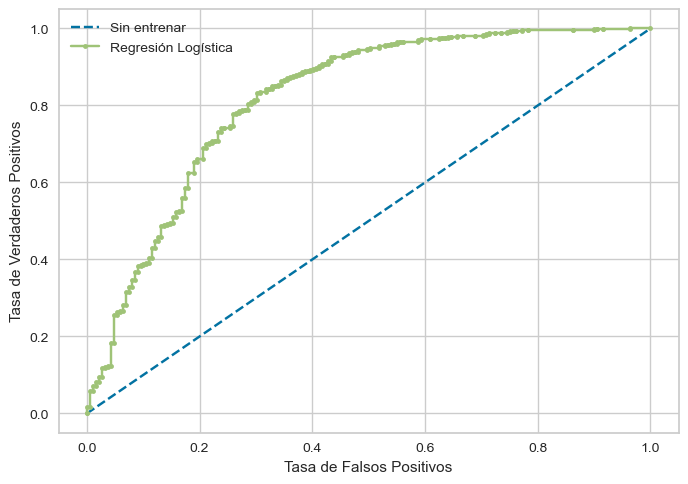

In [55]:
# Extraemos el Area bajo la curva ROC, porque ayuda mucho cuando hay desbalance entre 0 y 1
print('Curva ROC: ', metrics.roc_auc_score(y_tr_2, modelLog2.predict_proba(X_tr2)[:, 1]))
curva_roc(y_tst2, y_pred2, modelLog2, X_tst2)

In [56]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(modelLog2.score(X_tr2, y_tr_2)))
print('Test set score: {:.4f}'.format(modelLog2.score(X_tst2, y_tst2)))

Training set score: 0.8898
Test set score: 0.9044


## 3.5 Proceso con hiperparámetros: MODELO 3

Empleamos la librería GridSearchCV para que nos combine parámetros para solver, penalización y peso de las clases:
* La exactitud (accuracy) del modelo para clasificar correctamente es de un 85%: disminuye respecto a modelos anteriores.
* La matriz de confusión nos da: 30 verdaderos 0, 1326 verdaderos 1, 159 falsos 1, 85 falsos 0
* Para la clase 0 (No conversión):
    * Precisión de la clase 0: predicciones correctas de la clase 0 / total de predicciones de la clase 0 --> 26%. El modelo ha predicho 115 y ha acertado 30.
    * Recall: predicciones correctas de la clase 0 / registros reales de la clase 0 --> 16%. El modelo ha predicho bien 30 de 189 registros con 0. Empeora.
    * F1-Score: 20% --> el modelo detecta peor la clase 0 que los modelos anteriores.
* Para la clase 1 (Conversión):
    * Precisión de la clase 1: predicciones correctas de la clase 1 / total de predicciones de la clase 1 --> 89%. El modelo ha predicho 1485 y ha acertado 1326. Empeora respecto al modelo anterior.
    * Recall: predicciones correctas de la clase 1 / registros reales de la clase 1 --> 94%. El modelo ha predicho bien 1326 de 1411 registros con 1.
    * F1-Score: 92% --> el porcentaje mejora respecto a modelos anteriores.

* Área bajo la curva roc: 1> 0.62> 0.5 --> modelo malo, se aproxima al no modelo.
* No obstante, seguimos con una capacidad de predicción de los ceros baja.


In [57]:
# Creo un diccionario de métodos, que el modelo vaya combinando parámetros. Entrenamos con el dataset2, sin las variables innecesarias.

grid_param = {
    'solver': ['lbfgs', 'newton_cg', 'sag', 'liblinear'],
    'penalty': ['l1', 'l2', 'elasticnet'],
    'class_weight': ['balanced', 'unbalanced'],
    }

model_grid = GridSearchCV(estimator=modelo1, ##indicamos modelo
                     param_grid=grid_param,# indicamos hiperparámetros
                     scoring='f1',# métrica que queremos mejorar
                     cv=5,# validación cruzada: trocea el dataset en 5, y prueba 4 training y 1 en test cada vez.
                     n_jobs=-1)# 

model_grid.fit(X_tr2, y_tr_2)

GridSearchCV(cv=5,
             estimator=LogisticRegression(max_iter=1000, penalty=None,
                                          solver='newton-cg'),
             n_jobs=-1,
             param_grid={'class_weight': ['balanced', 'unbalanced'],
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['lbfgs', 'newton_cg', 'sag', 'liblinear']},
             scoring='f1')

In [58]:
print(model_grid.best_params_)

{'class_weight': 'balanced', 'penalty': 'l2', 'solver': 'sag'}


In [59]:
print(model_grid.best_score_)

0.9119459277060654


In [60]:
modelo3 = LogisticRegression(solver='sag', max_iter=1000, class_weight='balanced', penalty='l2')


Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones 0.84015625


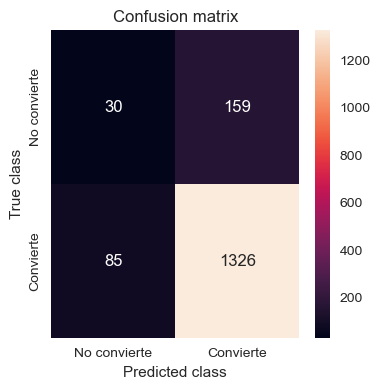

              precision    recall  f1-score   support

         0.0       0.26      0.16      0.20       189
         1.0       0.89      0.94      0.92      1411

    accuracy                           0.85      1600
   macro avg       0.58      0.55      0.56      1600
weighted avg       0.82      0.85      0.83      1600



In [61]:

# Ajuste de modelo
modelLoghiper = modelo3.fit(X_tr2,y_tr_2)

# Accuracy del modelo en training: el score da la tasa de acierto: el modelo clafisica correctamente el 87,5% de las observaciones
acc_hiper = modelLoghiper.score(X_tr2,y_tr_2)
print('Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones', acc_hiper)

# Predicciones en test
y_pred_hiper = modelLoghiper.predict(X_tst2)

mostrar_matriz(y_tst2, y_pred_hiper)

Curva ROC:  0.6345226212286872
Sin entrenar: ROC AUC=0.500
Regresión Logística: ROC AUC=0.621


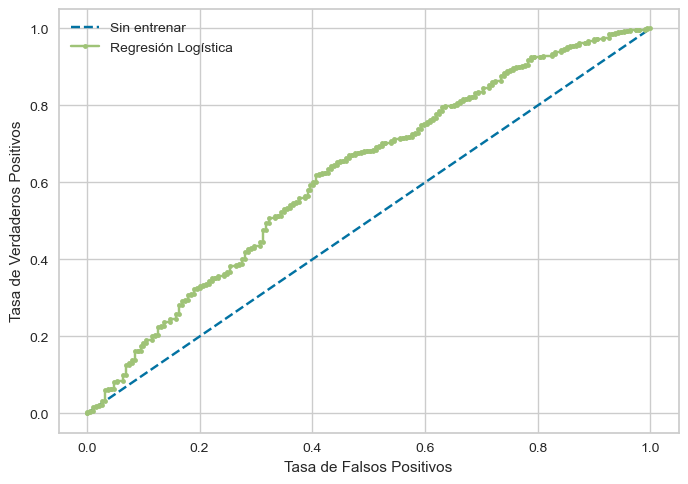

In [62]:
# Extraemos el Area bajo la curva ROC, porque ayuda mucho cuando hay desbalance entre 0 y 1
print('Curva ROC: ', metrics.roc_auc_score(y_tr_2, modelLoghiper.predict_proba(X_tr2)[:, 1]))
curva_roc(y_tst2, y_pred_hiper, modelLoghiper, X_tst2)

In [63]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(modelLoghiper.score(X_tr2, y_tr_2)))
print('Test set score: {:.4f}'.format(modelLoghiper.score(X_tst2, y_tst2)))

Training set score: 0.8402
Test set score: 0.8475


## 3.6- Balanceo del conjunto de datos: SAMPLIG CON SMOTE TOMEK: MODELO 4
Probamos a incluir sobremuestreo y submuestreo con la librería SMOTE para oversampling, y TOMEK para undersampling, para que balancee la muestra.
* La exactitud (accuracy) del modelo para clasificar correctamente es de un 73%: disminuye 17 puntos respecto a modelos anteriores.
* La matriz de confusión nos da: 145 verdaderos 0, 1024 verdaderos 1, 44 falsos 1, 387 falsos 0
* Para la clase 0 (No conversión):
    * Precisión de la clase 0: predicciones correctas de la clase 0 / total de predicciones de la clase 0 --> 27%. El modelo ha predicho 532 y ha acertado 145.
    * Recall: predicciones correctas de la clase 0 / registros reales de la clase 0 --> 77%. El modelo ha predicho bien 145 de 189 registros con 0. Mejora.
    * F1-Score: 41% --> el modelo detecta mejor la clase 0 que los modelos anteriores.
* Para la clase 1 (Conversión):
    * Precisión de la clase 1: predicciones correctas de la clase 1 / total de predicciones de la clase 1 --> 96%. El modelo ha predicho 1068 y ha acertado 1024. 
    * Recall: predicciones correctas de la clase 1 / registros reales de la clase 1 --> 73%. El modelo ha predicho bien 1024 de 1411 registros con 1.
    * F1-Score: 82% --> el porcentaje ha empeorado respecto a modelos anteriores.

* Área bajo la curva roc: 1> 0.81> 0.5 --> modelo relativamente bueno. Es mejor que el "no modelo" y muy levemente que el modelo anterior.
* Ninguna de las estrategias ha mejorado ostensiblemente la explicación del modelo.

In [64]:
os_us = SMOTETomek(sampling_strategy='auto')
X_train_tomek, y_train_tomek = os_us.fit_resample(X_tr2, y_tr_2)

print ("Distribución antes de resampling {}".format(X_tr2.shape))
print ("Distribución después de resampling {}".format(X_train_tomek.shape))

Distribución antes de resampling (6400, 14)
Distribución después de resampling (10158, 14)


Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones 0.7394172081118331


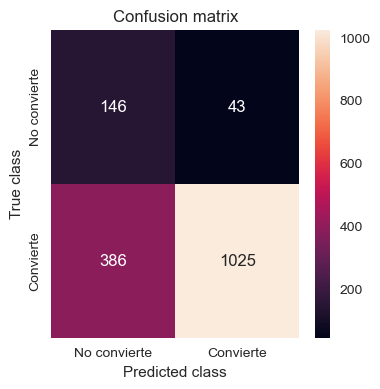

              precision    recall  f1-score   support

         0.0       0.27      0.77      0.40       189
         1.0       0.96      0.73      0.83      1411

    accuracy                           0.73      1600
   macro avg       0.62      0.75      0.62      1600
weighted avg       0.88      0.73      0.78      1600



In [65]:
# Arreglar y para que le guste a sklearn...numeric, creo un data set nuevo
# y_tr_tomek = y_train_tomek.y.ravel()

# Ajuste de modelo
modelLogtomek = modelo1.fit(X_train_tomek,y_train_tomek)

# Accuracy del modelo en training: el score da la tasa de acierto: el modelo clafisica correctamente el 87,5% de las observaciones
acc_tomek = modelLogtomek.score(X_train_tomek,y_train_tomek)
print('Precisión del modelo: el modelo clasifica correctamente el porcentaje de las observaciones', acc_tomek)

# Predicciones en test
y_pred_tomek = modelLogtomek.predict(X_tst2)

mostrar_matriz(y_tst2, y_pred_tomek)

Curva ROC:  0.8158626289776095
Sin entrenar: ROC AUC=0.500
Regresión Logística: ROC AUC=0.817


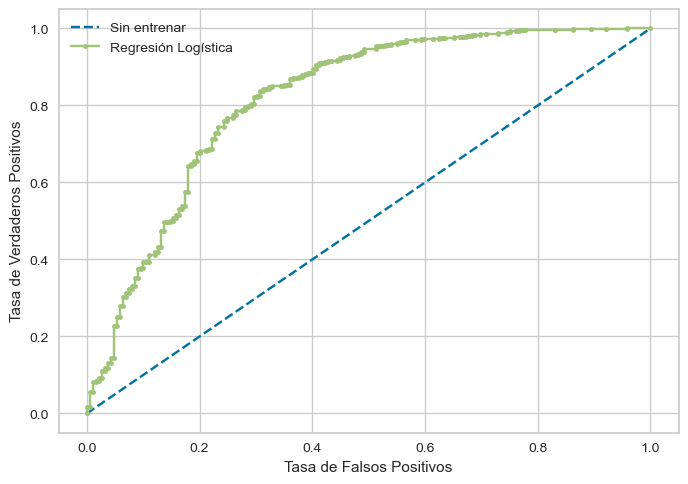

In [66]:
# Extraemos el Area bajo la curva ROC, porque ayuda mucho cuando hay desbalance entre 0 y 1
print('Curva ROC: ', metrics.roc_auc_score(y_train_tomek, modelLogtomek.predict_proba(X_train_tomek)[:, 1]))
curva_roc(y_tst2, y_pred_tomek, modelLogtomek, X_tst2)

In [67]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 18 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   CustomerID         8000 non-null   int64   
 1   Age                8000 non-null   int64   
 2   Gender             8000 non-null   category
 3   Income             8000 non-null   int64   
 4   CampaignChannel    8000 non-null   category
 5   CampaignType       8000 non-null   category
 6   AdSpend            8000 non-null   float64 
 7   ClickThroughRate   8000 non-null   float64 
 8   ConversionRate     8000 non-null   float64 
 9   WebsiteVisits      8000 non-null   int64   
 10  PagesPerVisit      8000 non-null   float64 
 11  TimeOnSite         8000 non-null   float64 
 12  SocialShares       8000 non-null   int64   
 13  EmailOpens         8000 non-null   int64   
 14  EmailClicks        8000 non-null   int64   
 15  PreviousPurchases  8000 non-null   int64   
 16  Loyalt

In [68]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(modelLogtomek.score(X_train_tomek, y_train_tomek)))
print('Test set score: {:.4f}'.format(modelLogtomek.score(X_tst2, y_tst2)))

Training set score: 0.7394
Test set score: 0.7319


# 4- ENFOQUE 2: MACHINEL LEARNING: ME QUEDO AQUÍ: TIRAR PYCARET YA

## 4.1- Selección inicial de modelos

In [69]:
# Creamos un dataset dummy, donde hayamos transformado las variables categóricas, para poder trabajar con él cuando vayamos a tunear hiperparámetros desde fuera de Pycaret (Pycaret hace transformación de variables)
dataset_dum = dataset.drop(['CustomerID'], axis=1)


In [70]:
dataset_dum.Gender.replace(('Male','Female'),
                      (0,1),inplace=True)

dataset_dum.CampaignType.replace(('Conversion','Awareness', 'Consideration', 'Retention'),
                      (1,2,3,4),inplace=True)

dataset_dum.CampaignChannel.replace(('Referral','PPC', 'Email', 'SEO', 'Social Media'),
                      (1,2,3,4,5),inplace=True)



Gender_df = pd.get_dummies(dataset_dum.Gender, prefix='Gender')
Gender_df['Gender_1'] = Gender_df['Gender_1'].astype('int')
Gender_df['Gender_0'] = Gender_df['Gender_0'].astype('int')


CampaignChannel_df = pd.get_dummies(dataset_dum.CampaignChannel, prefix='Channels')
CampaignChannel_df['Channels_3'] = CampaignChannel_df['Channels_3'].astype('int')
CampaignChannel_df['Channels_2'] = CampaignChannel_df['Channels_2'].astype('int')
CampaignChannel_df['Channels_1'] = CampaignChannel_df['Channels_1'].astype('int')
CampaignChannel_df['Channels_4'] = CampaignChannel_df['Channels_4'].astype('int')
CampaignChannel_df['Channels_5'] = CampaignChannel_df['Channels_5'].astype('int')

CampaignType_df = pd.get_dummies(dataset_dum.CampaignType, prefix='Objetivo')
CampaignType_df['Objetivo_1'] = CampaignType_df['Objetivo_1'].astype('int')
CampaignType_df['Objetivo_2'] = CampaignType_df['Objetivo_2'].astype('int')
CampaignType_df['Objetivo_3'] = CampaignType_df['Objetivo_3'].astype('int')
CampaignType_df['Objetivo_4'] = CampaignType_df['Objetivo_4'].astype('int')


dataset_dum = pd.concat([Gender_df, CampaignChannel_df, CampaignType_df, dataset_dum], axis=1)


In [71]:

pd.options.display.max_columns = None
dataset_dum.head(5)


,Gender_1,Gender_0,Channels_3,Channels_2,Channels_1,Channels_4,Channels_5,Objetivo_2,Objetivo_3,Objetivo_1,Objetivo_4,Age,Gender,Income,CampaignChannel,CampaignType,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints,y
0,1,0,0,0,0,0,1,1,0,0,0,56,1,136912,5,2,6497.870068,0.043919,0.088031,0,2.399017,7.396803,19,6,9,4,688,1
1,0,1,1,0,0,0,0,0,0,0,1,69,0,41760,3,4,3898.668606,0.155725,0.182725,42,2.917138,5.352549,5,2,7,2,3459,1
2,1,0,0,1,0,0,0,1,0,0,0,46,1,88456,2,2,1546.429596,0.277490,0.076423,2,8.223619,13.794901,0,11,2,8,2337,1
3,1,0,0,1,0,0,0,0,0,1,0,32,1,44085,2,1,539.525936,0.137611,0.088004,47,4.540939,14.688363,89,2,2,0,2463,1
4,1,0,0,1,0,0,0,0,0,1,0,60,1,83964,2,1,1678.043573,0.252851,0.109940,0,2.046847,13.993370,6,6,6,8,4345,1


In [72]:
# Borramos variables para evitar colinealidad
dataset_dum = dataset_dum.drop(['Gender', 'Gender_1', 'Channels_1', 'Objetivo_4', 'CampaignChannel', 'CampaignType'], axis=1)

In [73]:
# Dividimos el dataset, que luego también usaremos
varObj_dum = dataset_dum.y 
imput_dum = dataset_dum.drop(['y'],axis=1)

In [74]:
# Creamos training y test para usar con Pycaret (en principio no van a ahcer falta)
X_train_ml, X_test_ml, y_train_ml, y_test_ml = train_test_split(imput, varObj, test_size=0.2, random_state=1234)

In [75]:
# Creamos training y test para usar sin Pycaret, para todos los modelos que generemos de aquí en adelante:
X_train_dum, X_test_dum, y_train_dum, y_test_dum = train_test_split(imput_dum, varObj_dum, test_size=0.2, random_state=1234)

In [76]:
# Con la librería Pycaret obtenemos los modelos: en el setup se hacen automáticamente todas las transformaciones de las variables, el split en train y test, le meto balanceo
# Por defecto: el train size es 70%, aplica data_split_stratify
model_setup = setup(data=dataset_dum, target='y', session_id=1234, fix_imbalance = True)


,Description,Value
0,Session id,1234
1,Target,y
2,Target type,Binary
3,Original data shape,"(8000, 22)"
4,Transformed data shape,"(12216, 22)"
5,Transformed train set shape,"(9816, 22)"
6,Transformed test set shape,"(2400, 22)"
7,Numeric features,21
8,Preprocess,True
9,Imputation type,simple


In [77]:
models()

,Name,Reference,Turbo
ID,,,
lr,Logistic Regression,sklearn.linear_model._logistic.LogisticRegression,True
knn,K Neighbors Classifier,sklearn.neighbors._classification.KNeighborsCl...,True
nb,Naive Bayes,sklearn.naive_bayes.GaussianNB,True
dt,Decision Tree Classifier,sklearn.tree._classes.DecisionTreeClassifier,True
svm,SVM - Linear Kernel,sklearn.linear_model._stochastic_gradient.SGDC...,True
rbfsvm,SVM - Radial Kernel,sklearn.svm._classes.SVC,False
gpc,Gaussian Process Classifier,sklearn.gaussian_process._gpc.GaussianProcessC...,False
mlp,MLP Classifier,sklearn.neural_network._multilayer_perceptron....,False
ridge,Ridge Classifier,sklearn.linear_model._ridge.RidgeClassifier,True


In [78]:
## los primeros modelos son los ensemble: .
best_models = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
lightgbm,Light Gradient Boosting Machine,0.9111,0.8149,0.9861,0.9184,0.9511,0.4699,0.5103,0.2930
gbc,Gradient Boosting Classifier,0.9079,0.8221,0.9921,0.9108,0.9497,0.4157,0.4795,1.7120
xgboost,Extreme Gradient Boosting,0.9041,0.8017,0.9806,0.9159,0.9472,0.4350,0.4688,0.3590
ada,Ada Boost Classifier,0.8970,0.8095,0.9703,0.9170,0.9429,0.4220,0.4405,0.4250
rf,Random Forest Classifier,0.8845,0.7819,0.9923,0.8889,0.9377,0.1731,0.2523,0.6230
et,Extra Trees Classifier,0.8816,0.7609,0.9923,0.8863,0.9363,0.1399,0.2158,0.6140
dt,Decision Tree Classifier,0.7898,0.5940,0.8541,0.9010,0.8769,0.1611,0.1643,0.0830
qda,Quadratic Discriminant Analysis,0.7566,0.7143,0.7881,0.9229,0.8501,0.2232,0.2443,0.0400
ridge,Ridge Classifier,0.7182,0.0000,0.7180,0.9479,0.8170,0.2517,0.3050,0.0370
lda,Linear Discriminant Analysis,0.7182,0.7892,0.7180,0.9479,0.8170,0.2516,0.3049,0.0560


In [79]:
# Devuelve el mejor modelo
model_setup.automl()

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1234, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

## 4.2- Creamos el modelo LGBMC

In [80]:
# Creamos el modelo de LIGHTGBM
model_lightgbm = create_model('lightgbm')
print(model_lightgbm)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9054,0.8068,0.9837,0.9148,0.9480,0.4308,0.4695
1,0.9054,0.7692,0.9817,0.9163,0.9479,0.4399,0.4735
2,0.9107,0.8259,0.9857,0.9184,0.9509,0.4673,0.5060
3,0.9036,0.8072,0.9898,0.9084,0.9474,0.3852,0.4451
4,0.9125,0.8303,0.9837,0.9218,0.9517,0.4903,0.5220
5,0.9232,0.8465,0.9939,0.9242,0.9578,0.5382,0.5865
6,0.9107,0.8247,0.9857,0.9184,0.9509,0.4673,0.5060
7,0.9214,0.8193,0.9959,0.9209,0.9569,0.5157,0.5744
8,0.9089,0.8301,0.9796,0.9213,0.9496,0.4861,0.5117


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1234, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)


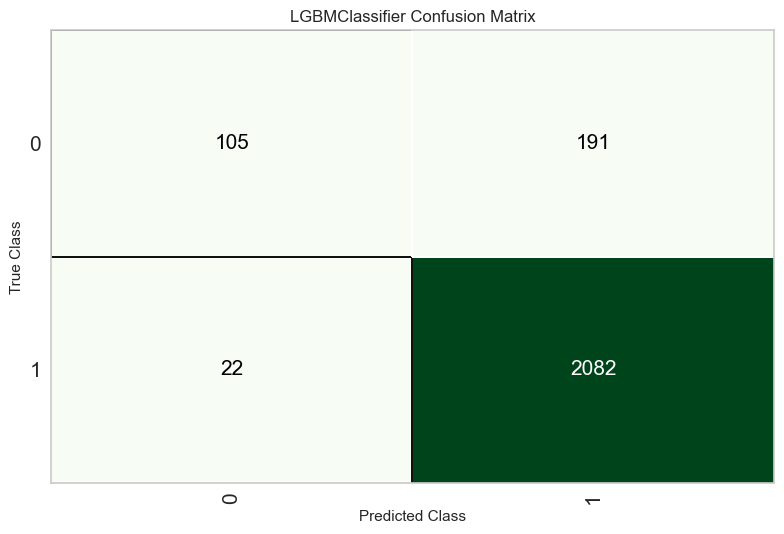

In [81]:
# Imprimimos matriz de confusión
plot_model(model_lightgbm, plot = "confusion_matrix", plot_kwargs={'percent' : False})

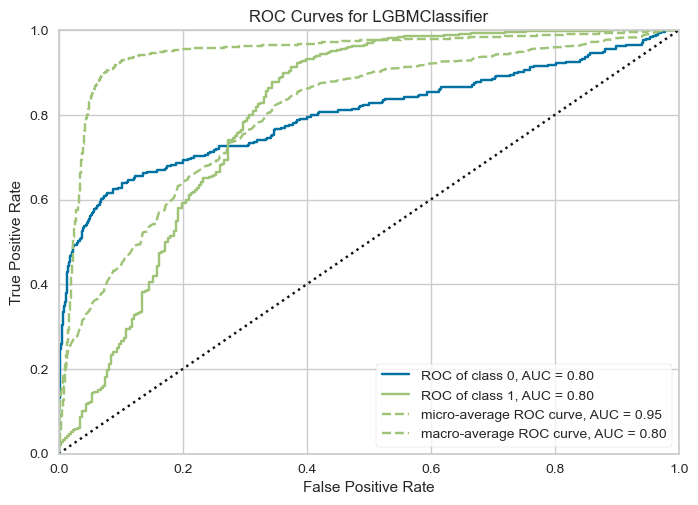

In [82]:
plot_model(model_lightgbm, plot = 'auc')

In [83]:
# Obtenemos evaluación del modelo
evaluate_model(model_lightgbm)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [84]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(model_lightgbm.score(X_train_dum, y_train_dum)))
print('Test set score: {:.4f}'.format(model_lightgbm.score(X_test_dum, y_test_dum)))

Training set score: 0.9516
Test set score: 0.9556


## 4.3- Creamos modelo lightgbm tuneado

In [85]:
# Le incremento los estimadores y aplico balanceo
import lightgbm as lgb
lgbm = lgb.LGBMClassifier(boosting_type='gbdt', class_weight='balanced', colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=500, n_jobs=-1, num_leaves=31, objective=None,
               random_state=1234, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

In [86]:
model_lgbm_dum = lgbm.fit(X_train_dum, y_train_dum)
model_lgbm_dum.score(X_test_dum, y_test_dum)

[LightGBM] [Info] Number of positive: 5601, number of negative: 799
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002715 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2044
[LightGBM] [Info] Number of data points in the train set: 6400, number of used features: 21
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=-0.000000
[LightGBM] [Info] Start training from score -0.000000


0.921875

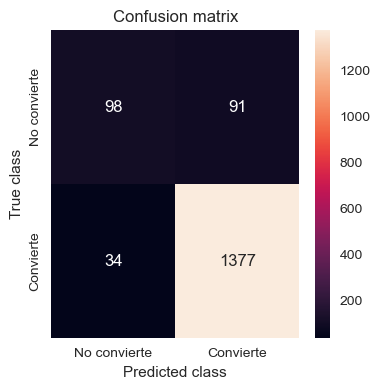

              precision    recall  f1-score   support

           0       0.74      0.52      0.61       189
           1       0.94      0.98      0.96      1411

    accuracy                           0.92      1600
   macro avg       0.84      0.75      0.78      1600
weighted avg       0.91      0.92      0.92      1600



In [87]:
y_pred_lgbm_dum = model_lgbm_dum.predict(X_test_dum)
mostrar_matriz(y_test_dum, y_pred_lgbm_dum)

Curva ROC:  1.0
Sin entrenar: ROC AUC=0.500
Regresión Logística: ROC AUC=0.840


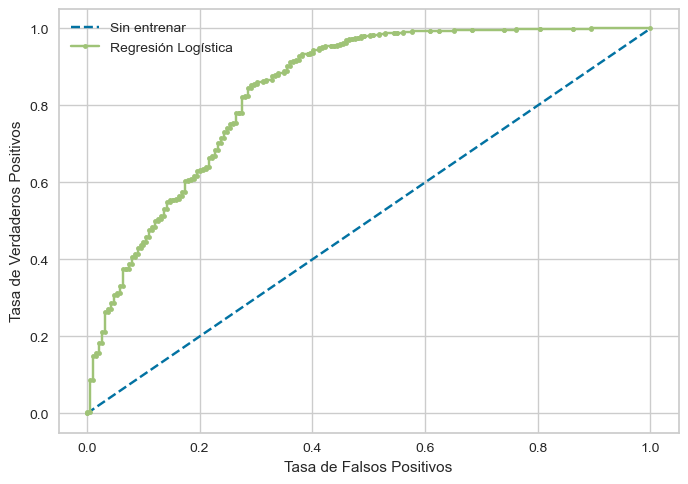

In [88]:
# Extraemos el Area bajo la curva ROC, porque ayuda mucho cuando hay desbalance entre 0 y 1
print('Curva ROC: ', metrics.roc_auc_score(y_train_dum, model_lgbm_dum.predict_proba(X_train_dum)[:, 1]))
curva_roc(y_test_dum, y_pred_lgbm_dum, model_lgbm_dum, X_test_dum)

In [89]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(model_lgbm_dum.score(X_train_dum, y_train_dum)))
print('Test set score: {:.4f}'.format(model_lgbm_dum.score(X_test_dum, y_test_dum)))

Training set score: 1.0000
Test set score: 0.9219


## 4.4- Modelo GBC

In [90]:
# Creamos el modelo de GBC
model_gbc = create_model('gbc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9071,0.8094,0.9919,0.9103,0.9493,0.4080,0.4714
1,0.9107,0.7913,0.9959,0.9106,0.9514,0.4208,0.4973
2,0.9071,0.8416,0.9919,0.9103,0.9493,0.4080,0.4714
3,0.9000,0.8454,0.9837,0.9096,0.9452,0.3836,0.4273
4,0.9054,0.8170,0.9898,0.9101,0.9483,0.4018,0.4595
5,0.9071,0.8263,0.9959,0.9072,0.9495,0.3870,0.4693
6,0.9089,0.8179,0.9898,0.9135,0.9501,0.4340,0.4873
7,0.9125,0.8243,0.9939,0.9139,0.9522,0.4469,0.5112
8,0.9089,0.8461,0.9939,0.9103,0.9502,0.4254,0.4935


In [91]:
# no ha hecho nada con los hiperparámetros. Podemos tunearlo
print(model_gbc)

GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=100, n_iter_no_change=None,
                           random_state=1234, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


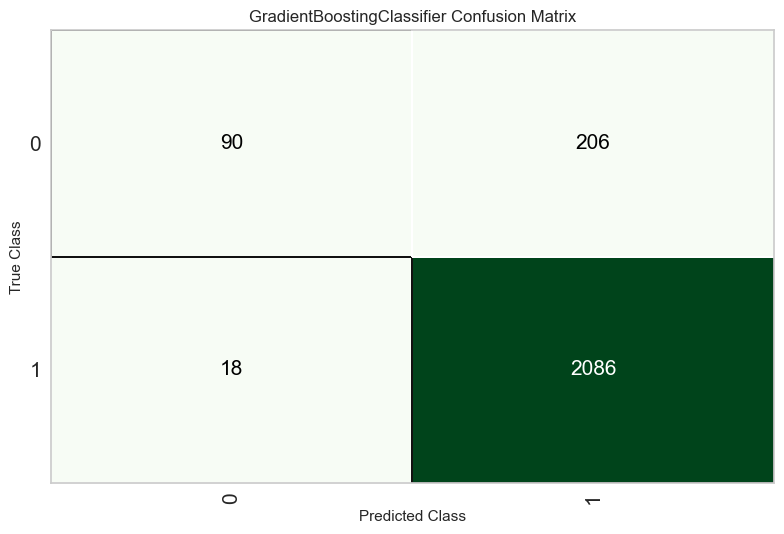

In [92]:
# Imprimimos matriz de confusión
plot_model(model_gbc, plot = "confusion_matrix", plot_kwargs={'percent' : False })

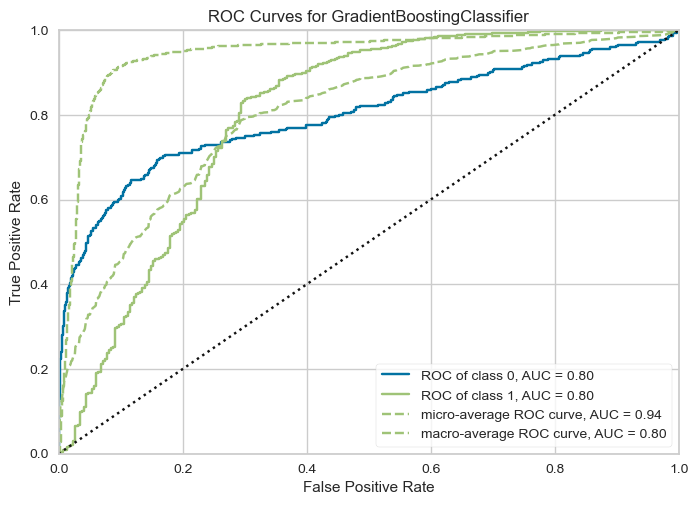

In [93]:
plot_model(model_gbc, plot = 'auc')

In [94]:
# Lanzamos el widget completo de evaluación del modelo. Algunas llamadas dan error.
evaluate_model(model_gbc)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [95]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(model_gbc.score(X_train_dum, y_train_dum)))
print('Test set score: {:.4f}'.format(model_gbc.score(X_test_dum, y_test_dum)))

Training set score: 0.9183
Test set score: 0.9250


In [96]:
# dashboard(model_gbc)

## 4.5- Tuneamos hiperparámetros de GBC

In [97]:
from sklearn.ensemble import GradientBoostingClassifier
gbc = GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='log_loss', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_samples_leaf=1,
                           min_samples_split=2, min_weight_fraction_leaf=0.0,
                           n_estimators=500, n_iter_no_change=None,
                           random_state=1234, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [98]:
model_gbc_dum = gbc.fit(X_train_dum, y_train_dum)
model_gbc_dum.score(X_test_dum, y_test_dum)

0.92125

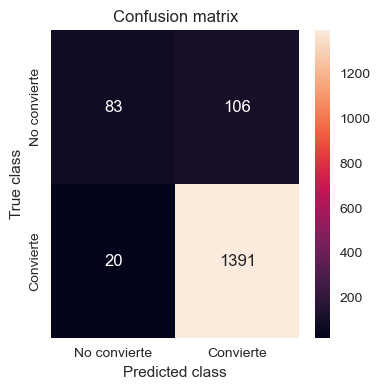

              precision    recall  f1-score   support

           0       0.81      0.44      0.57       189
           1       0.93      0.99      0.96      1411

    accuracy                           0.92      1600
   macro avg       0.87      0.71      0.76      1600
weighted avg       0.91      0.92      0.91      1600



In [99]:
y_pred_gbc_dum = model_gbc_dum.predict(X_test_dum)
mostrar_matriz(y_test_dum, y_pred_gbc_dum)

Curva ROC:  0.982852606107572
Sin entrenar: ROC AUC=0.500
Regresión Logística: ROC AUC=0.841


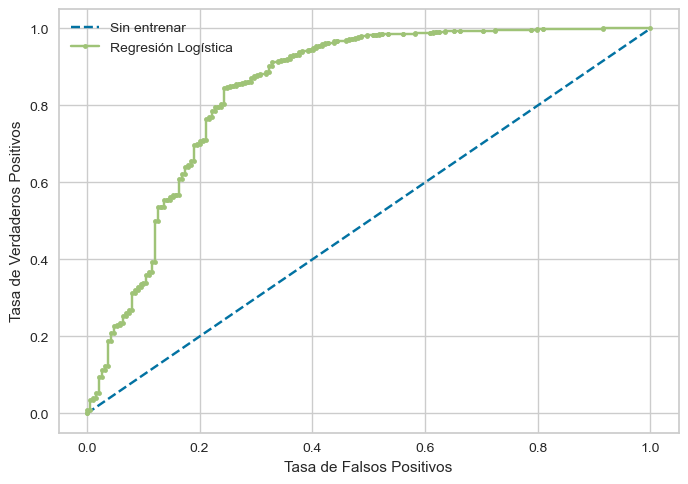

In [100]:
# Extraemos el Area bajo la curva ROC, porque ayuda mucho cuando hay desbalance entre 0 y 1
print('Curva ROC: ', metrics.roc_auc_score(y_train_dum, model_gbc_dum.predict_proba(X_train_dum)[:, 1]))
curva_roc(y_test_dum, y_pred_gbc_dum, model_gbc_dum, X_test_dum)

In [101]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(model_gbc_dum.score(X_train_dum, y_train_dum)))
print('Test set score: {:.4f}'.format(model_gbc_dum.score(X_test_dum, y_test_dum)))

Training set score: 0.9694
Test set score: 0.9213


## 4.6- Modelo XGBOOST

In [102]:
# Creamos el modelo de GBC
model_xgboost = create_model('xgboost')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8964,0.7892,0.9756,0.9124,0.9429,0.3919,0.4194
1,0.8929,0.7470,0.9735,0.9105,0.9409,0.3709,0.3970
2,0.9089,0.8070,0.9817,0.9198,0.9498,0.4695,0.4998
3,0.9018,0.8060,0.9817,0.9129,0.9460,0.4093,0.4461
4,0.8982,0.8117,0.9756,0.9141,0.9438,0.4070,0.4334
5,0.9161,0.8241,0.9959,0.9157,0.9541,0.4695,0.5370
6,0.8982,0.7959,0.9817,0.9094,0.9442,0.3778,0.4175
7,0.9089,0.8115,0.9857,0.9167,0.9500,0.4523,0.4929
8,0.9143,0.8293,0.9816,0.9250,0.9525,0.5200,0.5451


In [103]:
# no ha hecho nada con los hiperparámetros. Podemos tunearlo
print(model_xgboost)

XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', ...)


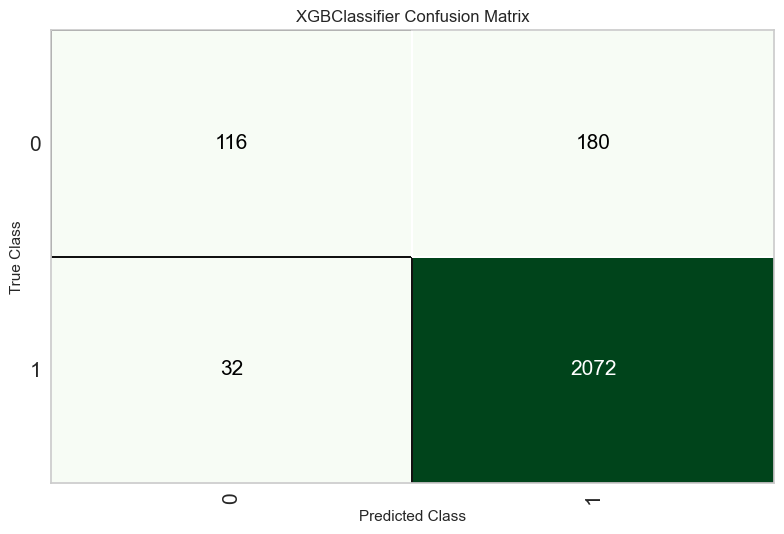

In [104]:
# Imprimimos matriz de confusión
plot_model(model_xgboost, plot = "confusion_matrix", plot_kwargs={'percent' : False})

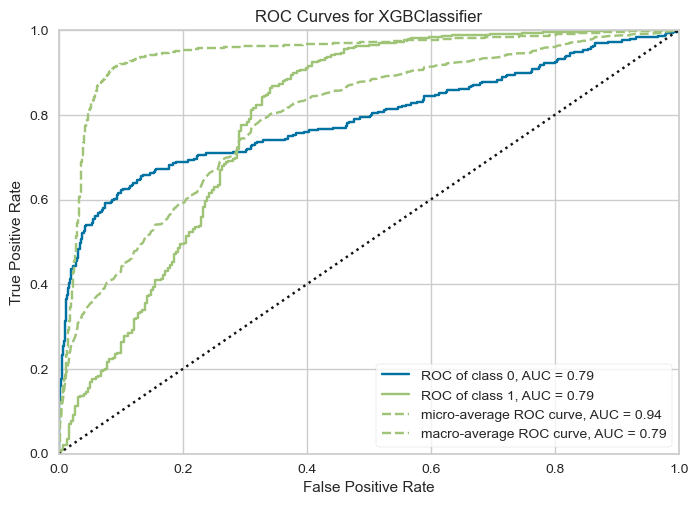

In [105]:
plot_model(model_xgboost, plot = 'auc')

In [106]:
# Lanzamos el widget completo de evaluación del modelo. Algunas llamadas dan error.
evaluate_model(model_xgboost)


interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [107]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(model_xgboost.score(X_train_dum, y_train_dum)))
print('Test set score: {:.4f}'.format(model_xgboost.score(X_test_dum, y_test_dum)))

Training set score: 0.9733
Test set score: 0.9744


In [108]:
# dashboard(model_xgboost)

## 4.7- Modelo XGBOOST AJUSTADO

In [109]:
# Añadimos max_Depth=60 y estimadores
xgbc = XGBClassifier(base_score=None, booster='gbtree', callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device='cpu', early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=60, max_leaves=None,
              min_child_weight=None, monotone_constraints=None,
              multi_strategy=None, n_estimators=500, n_jobs=-1,
              num_parallel_tree=None, objective='binary:logistic', random_state=1234)

In [110]:
model_xgbc_dum = xgbc.fit(X_train_dum, y_train_dum)
model_xgbc_dum.score(X_test_dum, y_test_dum)

0.923125

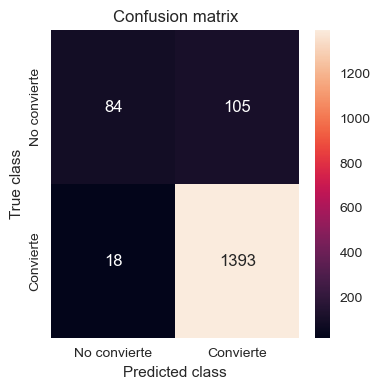

              precision    recall  f1-score   support

           0       0.82      0.44      0.58       189
           1       0.93      0.99      0.96      1411

    accuracy                           0.92      1600
   macro avg       0.88      0.72      0.77      1600
weighted avg       0.92      0.92      0.91      1600



In [111]:
y_pred_xgbc_dum = model_xgbc_dum.predict(X_test_dum)
mostrar_matriz(y_test_dum, y_pred_xgbc_dum)

Curva ROC:  1.0
Sin entrenar: ROC AUC=0.500
Regresión Logística: ROC AUC=0.843


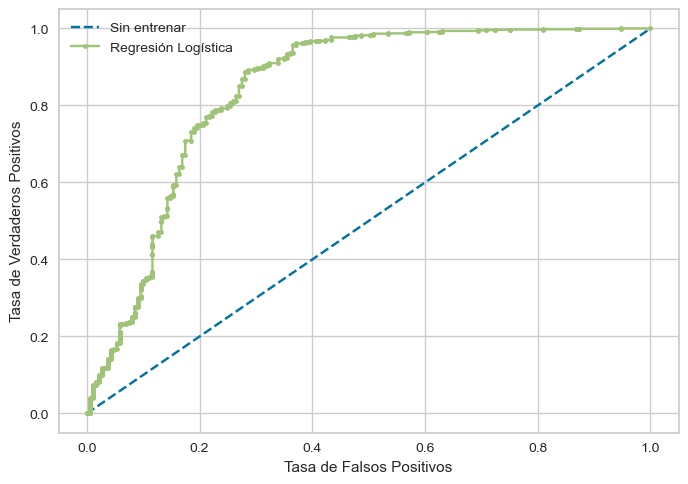

In [112]:
# Extraemos el Area bajo la curva ROC, porque ayuda mucho cuando hay desbalance entre 0 y 1
print('Curva ROC: ', metrics.roc_auc_score(y_train_dum, model_xgbc_dum.predict_proba(X_train_dum)[:, 1]))
curva_roc(y_test_dum, y_pred_xgbc_dum, model_xgbc_dum, X_test_dum)

In [113]:
# comprobamos si hay overfitting: la precisión es muy comparable en ambos sets, así que concluimos que no hay overfitting

print('Training set score: {:.4f}'.format(model_xgbc_dum.score(X_train_dum, y_train_dum)))
print('Test set score: {:.4f}'.format(model_xgbc_dum.score(X_test_dum, y_test_dum)))

Training set score: 1.0000
Test set score: 0.9231


# 5. ENFOQUE DEEP LEARNING
En este punto derivamos al notebook en Google Collab

# 6. EXPLICACIÓN DE UNA PREDICCIÓN <br>
¿Qué ha tenido en cuenta el modelo para predecir que la bomba en la posición de registro 5.300 tiene el 97% de probabilidades de funcionar? <br>
- Que el grupo de extracción es el 1. <br>
- Que la clase-tipo de extracción sea el 0. <br>
- Que la calidad del agua sea 6. <br>
- Que la fuente sea el 8. <br>
- Que el instalador sea aquél con una frecuencia de 21756 <br>

y, ¿Qué ha tenido en cuenta para NO incluir el registro en la clase de function? 3%: <br>
- Que el año de construcción sea 2009. <br>
- Que la cantidad sea 1. <br>
- Que han pasado 1016 días en que se registró la bomba. <br>
- Que la longitud sea 220.77. <br>
- que el fundador es aquél con una frecuencia 110. <br>


In [114]:
# Usamos la librería Lime para explicar los resultados
explainer = lime.lime_tabular.LimeTabularExplainer(X_train_dum.values, mode='classification',training_labels=y_train_dum,feature_names=X_train_dum.columns)



In [115]:
exp = explainer.explain_instance(X_train_dum.iloc[123], model_lightgbm.predict_proba, num_features=21)
exp.show_in_notebook(show_all=True)

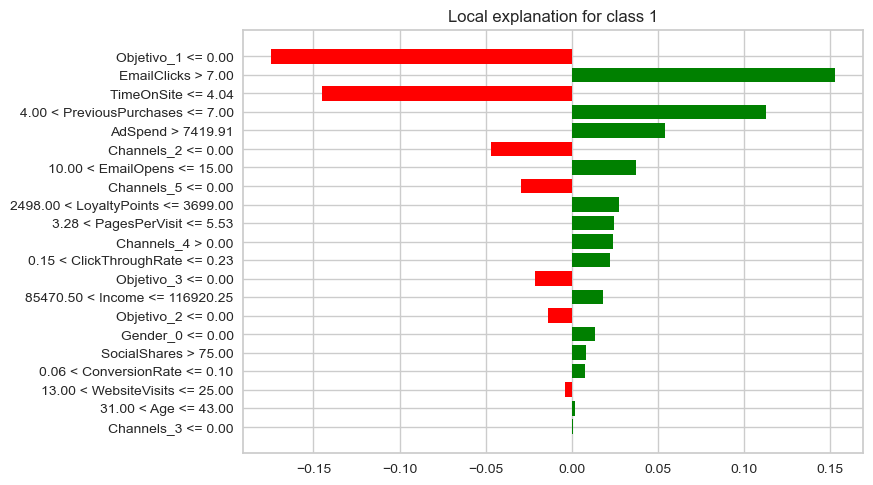

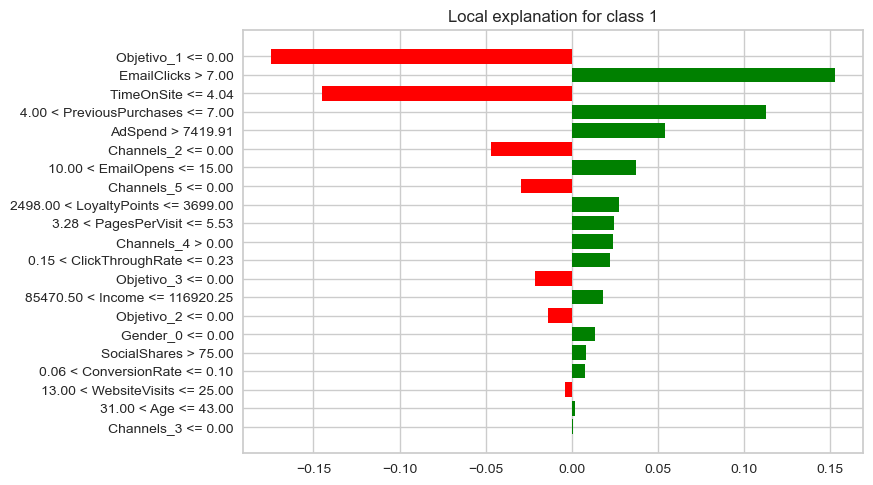

In [116]:
exp.as_pyplot_figure()

In [117]:
html = exp.as_html()

In [118]:
# Guardar el HTML en un archivo
with open("lime_explanation.html", "w") as file:
    file.write(html)

# 7. PREDICCIONES Y EXPORTACIÓN DEL MODELO

In [119]:
# Guardamos el modelo para poder llamarlo después sin tener que re-entrenarlo
pkl_filename = "model_lightgbm.pkl"
with open(pkl_filename, 'wb') as file:
    pickle.dump(model_lightgbm, file) # type: ignore


In [120]:
def predict_conversion(Gender_0,Channels_3,Channels_2,Channels_4,Channels_5,Objetivo_2,Objetivo_3,Objetivo_1,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,
                            EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints):
    # Load model
    with open("model_lightgbm.pkl", "rb") as f:
        model_final = pickle.load(f)

    input_data = [Gender_0,Channels_3,Channels_2,Channels_4,Channels_5,Objetivo_2,Objetivo_3,Objetivo_1,Age,Income,AdSpend,ClickThroughRate,ConversionRate,WebsiteVisits,PagesPerVisit,TimeOnSite,SocialShares,
                            EmailOpens,EmailClicks,PreviousPurchases,LoyaltyPoints]

    input_df = pd.DataFrame([input_data], columns=['Gender_0', 'Channels_3', 'Channels_2', 'Channels_4', 'Channels_5', 'Objetivo_2', 'Objetivo_3', 'Objetivo_1', 'Age', 'Income', 'AdSpend', 'ClickThroughRate',
    'ConversionRate', 'WebsiteVisits', 'PagesPerVisit', 'TimeOnSite', 'SocialShares', 'EmailOpens', 'EmailClicks', 'PreviousPurchases', 'LoyaltyPoints'])
    
    # Make prediction: ver cómo sacar las probabilidades y pintarlas que queda mejor
    pred = model_final.predict_proba(input_df)
    prediccion_final = {"Probabilidad de SÍ compra": np.round(float(pred[0][1]),2), "Probabilidad de NO compra": np.round(float(pred[0][0]),2)}
        
    return prediccion_final
    #return pred

In [121]:
desc = "Esta aplicación calcula la probabilidad de que un usuario realice una compra en base a las variables a continuación: " \
       "Todos los campos son *Obligatorios* para una correcta predicción"

iface = gr.Interface(fn=predict_conversion,
                     inputs=[gr.Number(label="¿Es hombre? Sí=1 / No=0"),
                             gr.Number(label="¿Es campaña de Email? Sí=1 / No=0"),
                             gr.Number(label="¿Es campaña de PPC? Sí=1 / No=0"),
                             gr.Number(label="¿Es campaña de SEO? Sí=1 / No=0"),
                             gr.Number(label="¿Es campaña de Social Media? Sí=1 / No=0"),
                             gr.Number(label="¿El objetivo es Awareness? Sí=1 / No=0"),
                             gr.Number(label="¿El objetivo es Consideration? Sí=1 / No=0"),
                             gr.Number(label="¿El objetivo es Conversion? Sí=1 / No=0"),
                             gr.Number(label="¿Qué edad tiene?"),
                             gr.Number(label="¿Qué ingresos tiene?"),
                             gr.Number(label="¿Cuál ha sido el gasto en publicidad?"),
                             gr.Number(label="¿Cuál es el CTR? número con decimales"),
                             gr.Number(label="¿Cuál es la tasa de conversión? número con decimales"),
                             gr.Number(label="¿Cuántas visitas a la web ha hecho?"),
                             gr.Number(label="¿Cuántas páginas por visita ha hecho?"),
                             gr.Number(label="¿Cuál ha sido el tiempo en página en minutos?"),
                             gr.Number(label="¿Cuántos social shares ha hecho?"),
                             gr.Number(label="¿Cuántas aperturas de email ha hecho?"),
                             gr.Number(label="¿Cuántos clicks en los emails ha hecho?"),
                             gr.Number(label="¿Cuántas compras previas ha hecho?"),
                             gr.Number(label="¿Cuántos puntos de fidelización tiene?")],
                              outputs= gr.Label("RESULTADOS:"),
                              
                       title="Modelo de predicción de compra en campañas de Marketing Digital",
                       description=desc,
                       theme=gr.themes.Soft())
iface.launch(share=True)

Running on local URL:  http://127.0.0.1:7860

Could not create share link. Please check your internet connection or our status page: https://status.gradio.app.


# Librería que proporciona una explicación del modelo. Adjuntamos html en el proyecto.

In [122]:
# dashboard(model_lightgbm)